In [4]:
import tensorboard
%reload_ext tensorboard
#%tensorboard --logdir=logs/ --host localhost --port 8888

import datetime
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_score
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.model_selection import KFold
# Se importan librerías para graficar.
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras import backend as K
import kerastuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Activation, Input, Dropout
from keras import regularizers
from keras.callbacks import ModelCheckpoint
from tensorflow.keras import optimizers
from sklearn.preprocessing import PolynomialFeatures
from keras.regularizers import l2, l1

In [5]:
df = pd.read_csv('diabetes.csv')

In [6]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [7]:
healthy_people_num = (df['Outcome'] == 0).sum()
sick_people_num = (df['Outcome'] != 0).sum()
total = df.shape[0]
print("Healthy people: " + str(healthy_people_num))
print("Sick people: " + str(sick_people_num))
print("Total: " + str(total))

Healthy people: 500
Sick people: 268
Total: 768


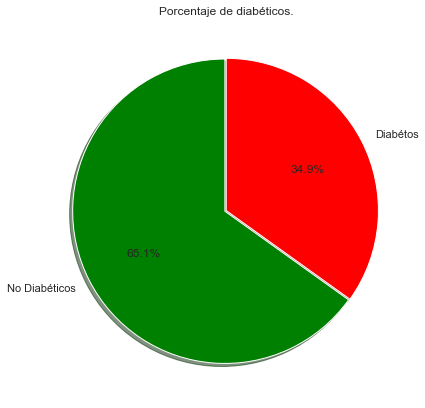

In [8]:
sns.set(style="whitegrid")
labels = ['No Diabéticos', 'Diabétos']
sizes = [healthy_people_num,sick_people_num]
colors = ["green","red"]
plt.figure(figsize=(7,7))
plt.pie(sizes, labels=labels, explode= (0.01,0) , colors=colors, autopct='%1.1f%%', shadow=True, startangle=90,)

plt.title('Porcentaje de diabéticos.')
plt.show()

In [9]:
df2 = df.copy()
df2[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df2[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

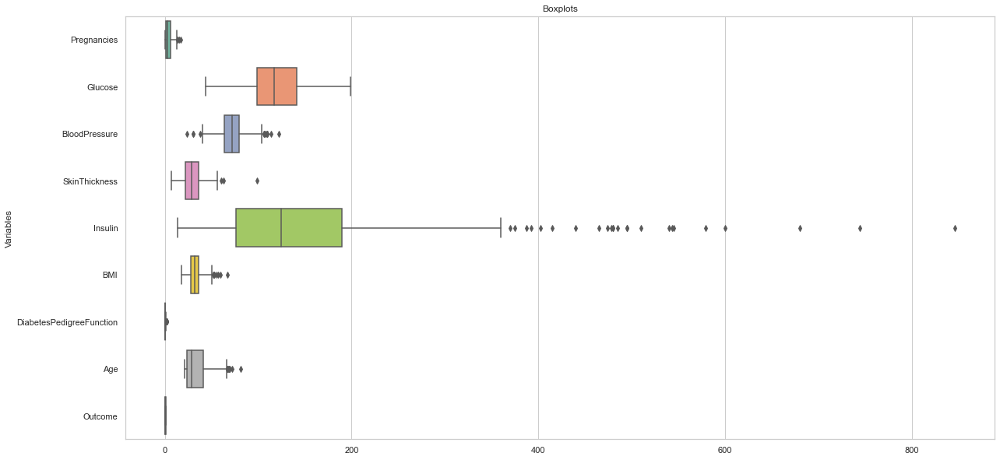

In [10]:
f, ax = plt.subplots(figsize=(20, 10))
plt.ylabel('Variables')
plt.title("Boxplots")
ax = sns.boxplot(data = df2, 
  orient = 'h', 
  palette = 'Set2')

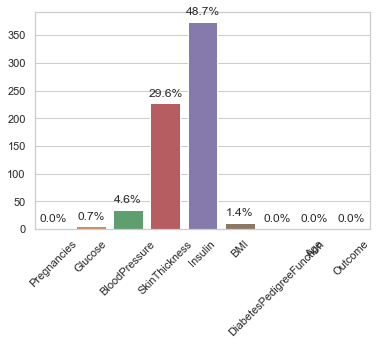

In [11]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df2.columns, y=df2.isnull().sum())
plt.xticks(rotation=45);
for p in ax.patches:
    ax.annotate(format(100*p.get_height()/df.shape[0], '.1f') + "%", 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 10), 
                   textcoords = 'offset points')

In [12]:
correlations = df2.corr()
correlations['Outcome'].sort_values(ascending=False)

Outcome                     1.000000
Glucose                     0.494650
BMI                         0.313680
Insulin                     0.303454
SkinThickness               0.259491
Age                         0.238356
Pregnancies                 0.221898
DiabetesPedigreeFunction    0.173844
BloodPressure               0.170589
Name: Outcome, dtype: float64

In [13]:
df = df.drop(['Insulin'], axis=1)
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,33.6,0.627,50,1
1,1,85,66,29,26.6,0.351,31,0
2,8,183,64,0,23.3,0.672,32,1
3,1,89,66,23,28.1,0.167,21,0
4,0,137,40,35,43.1,2.288,33,1


In [14]:
 def separate_data_and_labels(df):
        data = df.copy()
        y_values = data[data.columns[-1]].values.reshape(data.shape[0], 1)
        data = data.drop([data.columns[-1]], axis=1)
        return data, y_values

In [15]:
np.random.seed(0)
msk = np.random.rand(len(df)) < 0.8
train_val_df = df[msk]
testData = df[~msk]

train_val_data , y_train_val = separate_data_and_labels(train_val_df)
x_test_data, y_test_values = separate_data_and_labels(testData)

In [16]:
def specificity(y_true, y_pred):
    tn = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    fp = K.sum(K.round(K.clip((1 - y_true) * y_pred, 0, 1)))
    return tn / (tn + fp + K.epsilon())


def negative_predictive_value(y_true, y_pred):
    tn = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    fn = K.sum(K.round(K.clip(y_true * (1 - y_pred), 0, 1)))
    return tn / (tn + fn + K.epsilon())

def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    sens_keras = true_positives / (possible_positives + K.epsilon())
    return sens_keras

def positive_predictive_value(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    ppv_keras = true_positives / (predicted_positives + K.epsilon())
    return ppv_keras

In [17]:
def plot_loss(history):
    # Plot the training loss.
    plt.plot(history.history['loss'], 'r-')
    # Plot the validation loss.
    plt.plot(history.history['val_loss'], 'b-')
    # X-axis label.
    plt.xlabel('Epochs')
    # Y-axis label.
    plt.ylabel('Cost')
    # Graph legend.
    plt.legend(["Training loss", "Validation loss"])
    # Graph title.
    plt.title('Loss Graph')
    plt.show()

In [37]:
class DiabetesPredictor:
    def __init__(self, name):
        """DiabetesPredictor

    This is a class contains the most part of the methods needed for the diabetes predictor,
    first get the data of the csv file and then perform some methods to clean the data insid
    and allows you to choose if it has to replace outliers or not and replace nulls values or not.

    """
        self.name = name

    def fit(self, train_df, y_train, val_df, y_val, replaceOutliers=False, replaceNulls=False, nullColumns=[], outliersColumnsMap={}, columnsToRemove=[], polyFeatDeg = -1, binsDiscretizer = -1, earlyStop = False, dropOut = False, regu = '', batchNormalization = False, learning_rate = 1e-3, momentum= 0.99, decay = 1e-4, multilayer = False, layerUnits = [], epochs = 120, testing = False):
        train_dataframe = train_df.copy()

        self.columnsToRemove = columnsToRemove.copy()
        self.nullCols = nullColumns.copy()
        self.replaceNulls = replaceNulls
        self.replaceOutliers = replaceOutliers
        self.polyFeatDeg = polyFeatDeg
        self.binsDiscretizer = binsDiscretizer
        self.earlyStop = earlyStop
        self.dropOut = dropOut
        self.regu = regu
        self.batchNormalization = batchNormalization
        self.learning_rate = learning_rate
        self.momentum = momentum
        self.decay = decay
        self.multilayer = multilayer
        self.layerUnits = layerUnits
        self.epochs = epochs
        self.testing = testing

        self.replace_values_nulls = []
        self.replace_values_outliers = []
        self.outliersLimits = []
        self.history = None

        self.nullCols = [n for n in self.nullCols if n not in self.columnsToRemove]
        self.outlierCols = {}
        for k in outliersColumnsMap:
            if k not in self.columnsToRemove:
                self.outlierCols[k] = outliersColumnsMap[k].copy()

        train_dataframe = self.__preprocess_data__(train_dataframe, training=True)

        x_train_values = train_dataframe.values
        y_train_values = y_train.copy()

        self.input_shape = x_train_values.shape

        x_val_df = val_df.copy()
        x_val_df = self.__preprocess_data__(x_val_df)
        x_val_values = x_val_df.values
        y_val_values = y_val.copy()

        self.model = self.__train_model__(x_train_values, y_train_values, x_val_values,y_val_values)

        self.auc, self.spe, self.sen, self.ppv, self.npv, self.fpr, self.tpr = self.evaluate(x_val_df, y_val_values)

        if not self.testing:
            self.aucTrain, self.speTrain, self.senTrain, self.ppvTrain, self.npvTrain, self.fprTrain, self.tprTrain = self.evaluate(train_dataframe, y_train_values)
        
    def __preprocess_data__(self, data, training = False):
        df = data.copy()
        df = self.__remove_columns__(df)

        if self.replaceNulls:
            df[self.nullCols] = df[self.nullCols].replace(0,np.NaN)

        if training:
            self.replace_values_outliers = self.__get_cols_median__(df)
            self.outliersLimits = self.__get_outliers_limits__(df)

        if(self.replaceOutliers):
            df = self.__replace_outliers__(df)

        if training:
            self.replace_values_nulls = self.__get_cols_median__(df)

        if(self.replaceNulls):
            df = self.__replace_nulls__(df)

        if (self.polyFeatDeg > 0):
            poly = PolynomialFeatures(degree=self.polyFeatDeg)
            polyArray = poly.fit_transform(df)
            c = poly.get_feature_names(df.columns)
            df = pd.DataFrame(polyArray, columns = c)

        if (self.binsDiscretizer > 1):
            disc = KBinsDiscretizer(n_bins=self.binsDiscretizer, encode='ordinal', strategy='uniform')
            df = disc.fit_transform(df)

        if training:
            self.mean_cols = self.__get_cols_mean__(df)
            self.std_cols = self.__get_cols_std__(df)

        df = self.__normalize_data__(df)

        return df

    def __get_cols_mean__(self, data):
        meandf = data.mean(axis = 0)
        meandf.columns = data.columns
        return meandf

    def __get_cols_std__(self, data):
        stddf= data.std(axis = 0)
        stddf.columns = data.columns
        return stddf

    def __get_cols_median__(self, data):
        mediandf = data.median(axis = 0)
        mediandf.columns = data.columns
        return mediandf

    def __get_outliers_limits__(self, data):
        df = pd.DataFrame(np.zeros((1,len(data.columns))), columns=data.columns)
        df = df.astype('object')
        for col in data.columns:
            col_min = 0
            col_max = np.Infinity
            if (col in self.outlierCols):
                #Cálculo de parámetros para obtener los outliers.
                q1 = data[col].quantile(0.25)
                q3 = data[col].quantile(0.75)
                iqr = q3-q1
                #Límites de los valores tipicos.
                lower_tail = q1 - 1.5 * iqr
                upper_tail = q3 + 1.5 * iqr

                col_min = min(lower_tail, self.outlierCols[col][0])
                col_max = max(upper_tail,self.outlierCols[col][1])
            lims = [col_min, col_max]
            df[col][0] = lims
        return df

    def __replace_outliers__(self, dataframe):
        #Para cada columna (excepto para el Outcome) se reemplazan los outliers por su mediana.
        df = dataframe.copy()
        for col in df.columns:
            out_min = self.outliersLimits[col][0][0]
            out_max = self.outliersLimits[col][0][1]
            for i in df[col]:
                if i > out_max or i < out_min:
                    df[col] = df[col].replace(i, self.replace_values_outliers[col])
        return df

    def __replace_nulls__(self, dataframe):
        df = dataframe.copy()
        for col in self.nullCols:
            df[col]=df[col].replace(np.NaN, self.replace_values_nulls[col])
        return df

    def __normalize_data__(self, dataframe):
        # Mean, columnar axis.
        df = dataframe.copy()
        for col in df.columns:
            if (self.std_cols[col] != 0):
                df[col] = (df[col] - self.mean_cols[col]) / self.std_cols[col]
            else:
                df[col] = 0
        return df

    def __remove_columns__(self, dataframe):
        df = dataframe.copy()
        df = df.drop(self.columnsToRemove, axis=1)
        return df

    def __model_builder__(self):
        model = Sequential()
        ini = tf.keras.initializers.GlorotNormal(seed=7)
        reg = None
        if(self.regu == 'l1' or self.regu == 'l2'):
            reg = reg_wrapper(self.regu, 0.1)
        if (self.multilayer):
            if (self.batchNormalization):
                model.add(BatchNormalization())
            elif (self.dropOut):
                model.add(Dropout(0.5))
            model.add(Dense(self.layerUnits[0], kernel_initializer=ini, bias_initializer=ini,kernel_regularizer=reg, activation='relu'))
            if (self.batchNormalization):
                model.add(BatchNormalization())
            elif (self.dropOut):
                model.add(Dropout(0.5))
            model.add(Dense(self.layerUnits[1], kernel_initializer=ini, bias_initializer=ini,kernel_regularizer=reg, activation='relu'))
            if (self.batchNormalization):
                model.add(BatchNormalization())
            elif (self.dropOut):
                model.add(Dropout(0.5))
            model.add(Dense(1, kernel_initializer=ini, bias_initializer=ini,kernel_regularizer=reg,activation='sigmoid'))
        else:
            if(self.dropOut):
                model.add(Dropout(0.5))
            elif(self.batchNormalization):
                model.add(BatchNormalization())

            
            model.add(Dense(1, kernel_initializer=ini,bias_initializer=ini,kernel_regularizer=reg, activation='sigmoid'))

        model.compile(optimizer=optimizers.SGD(learning_rate=self.learning_rate, momentum=self.momentum, decay = self.decay),
                        loss=keras.losses.BinaryCrossentropy(),
                        metrics=[tf.keras.metrics.AUC()])
        return model

    def __train_model__(self, x_train, y_train, x_val, y_val):        
        stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

        model = self.__model_builder__()

        # ckpt_model = 'saved_models/'+ self.name
        # checkpoint = ModelCheckpoint(ckpt_model, 
        #                     monitor='val_loss',
        #                     verbose=0,
        #                     save_weights_only=True,
        #                     save_best_only=True,
        #                     mode='min')
        tb_callback = tf.keras.callbacks.TensorBoard(log_dir='./logs/' + self.name, update_freq=2)
        # cbks = [checkpoint]
        cbks = [tb_callback]
        if (self.earlyStop):
            cbks.append(stop_early)
        
        history = model.fit(x_train, y_train, epochs=self.epochs, batch_size=64, validation_data = (x_val, y_val), verbose=0, callbacks = cbks)

        self.history = history
        # Plot Loss
        plot_loss(history)        

        # Return trained model
        return model

    def evaluate(self, x_val_df, y_val):
        x_df = x_val_df.copy()
        predictions, rounded_preds = self.predict(x_df)

        fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_val, predictions)
        auc_keras = auc(fpr_keras, tpr_keras)
        spe = specificity(y_val.astype(float),  rounded_preds.astype(float))
        sen = sensitivity(y_val.astype(float),  rounded_preds.astype(float))
        ppv = positive_predictive_value(y_val.astype(float), rounded_preds.astype(float))
        npv = negative_predictive_value(y_val.astype(float), rounded_preds.astype(float))

        if (self.testing):
            self.plot_roc(fpr_keras, tpr_keras, auc_keras)
            print('AUC ' + str(auc_keras))
            print('Specificity: ' + str(spe))
            print('Sensitivity: ' + str(sen))
            print('Positive Predictive Value: ' + str(ppv))
            print('Negative Predictive Value: ' + str(npv))

        return auc_keras, spe, sen, ppv, npv, fpr_keras, tpr_keras

    def predict(self, x_val_df):
        x_df = x_val_df.copy()
        predictions = self.model(x_df.values)
        rounded_preds = np.rint(predictions)
        return predictions, rounded_preds

    def plot_roc_validation(self):
        self.plot_roc(self.fpr, self.tpr, self.auc)

    def plot_roc(self, fpr, tpr, auc):
        plt.figure(1)
        plt.plot([0, 1], [0, 1], 'k--')
        plt.plot(fpr, tpr, label=' (Area = {:.2f})'.format(auc))
        plt.xlabel('False positive rate')
        plt.ylabel('True positive rate')
        plt.title('ROC curve ' + self.name)
        plt.legend(loc='best')
        plt.show()

In [19]:
def reg_wrapper(type, value):
    if type == 'l2':
        return regularizers.l2(value)
    if type == 'l1':
        return regularizers.l1(value)

In [20]:
kf = KFold(n_splits = 5)

def cross_val(name, replaceOutliers=False, replaceNulls=False, nullColumns=[], outliersColumnsMap={}, columnsToRemove=[], polyFeatDeg = -1, binsDiscretizer = -1, earlyStop = False, dropOut = False, regu = '', batchNormalization = False, learning_rate = 1e-3, momentum= 0.99, decay = 1e-4, multilayer = False, layerUnits = [], epochs = 120, testing = False):
    folds = kf.split(train_val_data)
    bestModel = None
    aucs = []
    spes = []
    sens = []
    ppvs = []
    npvs = []
    aucsTrain = []
    i = 0
    for train_index, val_index in folds:
        print('Fold ' + str(i))
        # Create new model
        newModel = DiabetesPredictor(name + str(i))
        i += 1
        X_train, X_val = train_val_data.iloc[train_index], train_val_data.iloc[val_index]
        Y_train, Y_val = y_train_val[train_index], y_train_val[val_index]
        
        # Train model
        newModel.fit(X_train, Y_train, X_val, Y_val, replaceOutliers=replaceOutliers, replaceNulls=replaceNulls, nullColumns = nullColumns, outliersColumnsMap=outliersColumnsMap, columnsToRemove=columnsToRemove, polyFeatDeg=polyFeatDeg, binsDiscretizer=binsDiscretizer, earlyStop=earlyStop, dropOut=dropOut, regu=regu, batchNormalization=batchNormalization, learning_rate = learning_rate, momentum= momentum, decay = decay, multilayer = multilayer, layerUnits = layerUnits, epochs = epochs, testing = testing)
        # Append iteration metrics
        aucs.append(newModel.auc)
        spes.append(newModel.spe)
        sens.append(newModel.sen)
        ppvs.append(newModel.ppv)
        npvs.append(newModel.npv)
        aucsTrain.append(newModel.aucTrain)
        # Compare main metric
        if (bestModel==None or newModel.auc > bestModel.auc):
            bestModel = newModel
    
    # Calculate mean metric
    aucTrainMean = np.mean(np.array(aucsTrain))
    aucMean = np.mean(np.array(aucs))
    speMean = np.mean(np.array(spes))
    senMean = np.mean(np.array(sens))
    ppvMean = np.mean(np.array(ppvs))
    npvMean = np.mean(np.array(npvs))

    # Inform metrics
    print('AUC Val: ' + str(aucMean))
    print('AUC Train: ' + str(aucTrainMean))
    print('Specificity: ' + str(speMean))
    print('Sensitivity: ' + str(senMean))
    print('Positive Predictive Value: ' + str(ppvMean))
    print('Negative Predictive Value: ' + str(npvMean))

    return bestModel, aucMean, speMean, senMean, ppvMean, npvMean, aucTrainMean

### Sin limpiar datos

Fold 0


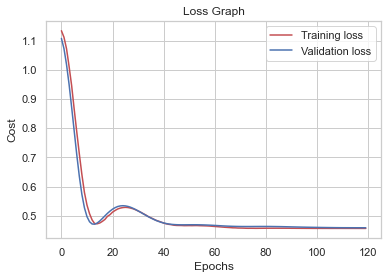

Fold 1


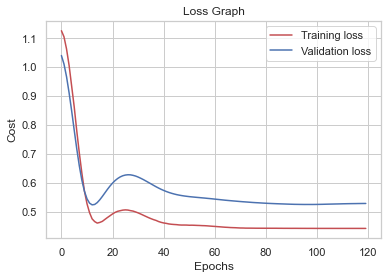

Fold 2


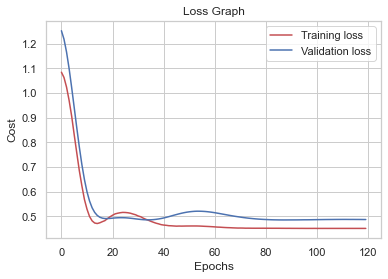

Fold 3


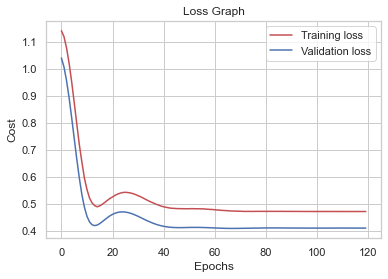

Fold 4


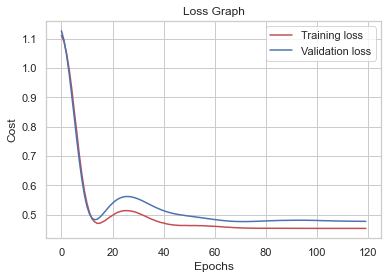

AUC Val: 0.8421707313439913
AUC Train: 0.851050551973047
Specificity: 0.8767660491744769
Sensitivity: 0.5899191695394597
Positive Predictive Value: 0.7185390840762238
Negative Predictive Value: 0.7945318240836775


In [423]:
simplePred, aucPred, spePred, senPred, ppvPred, npvPred, aucTrainPred = cross_val('predictor')

## Limpiando Datos
#### Reemplazando Nulls por la mediana

Fold 0


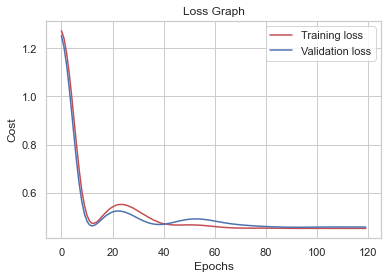

Fold 1


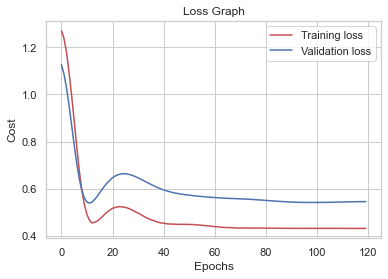

Fold 2


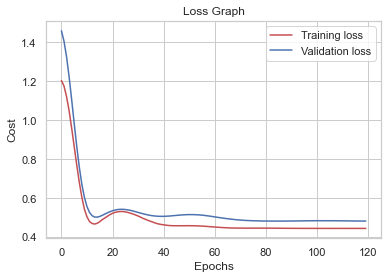

Fold 3


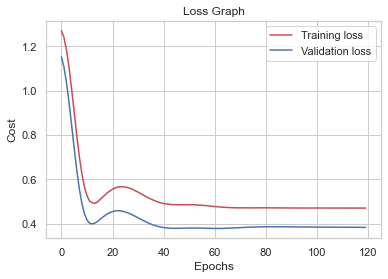

Fold 4


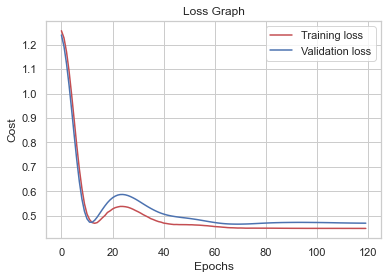

AUC Val: 0.8487895574334356
AUC Train: 0.8560606188950878
Specificity: 0.883213504660605
Sensitivity: 0.5835276451948507
Positive Predictive Value: 0.7244339381235557
Negative Predictive Value: 0.793053755592241


In [424]:
repNullPred, aucrepNull, sperepNull, senrepNull, ppvrepNull, npvrepNull, aucTrainRepNull = cross_val('rep_nulls_predictor',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'])

#### Reemplazando Outliers

Fold 0


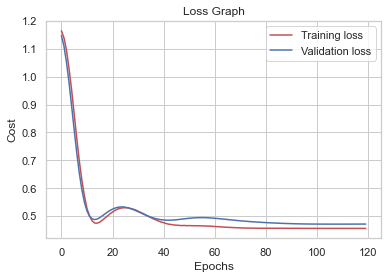

Fold 1


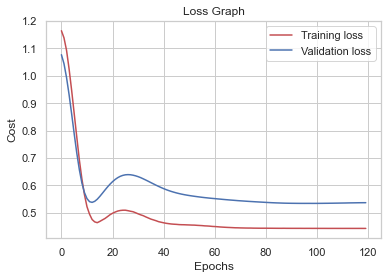

Fold 2


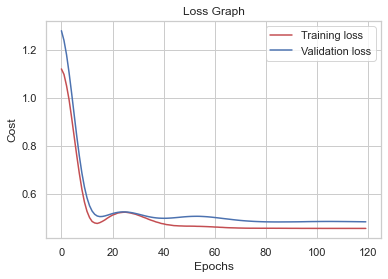

Fold 3


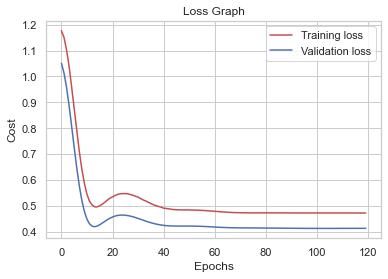

Fold 4


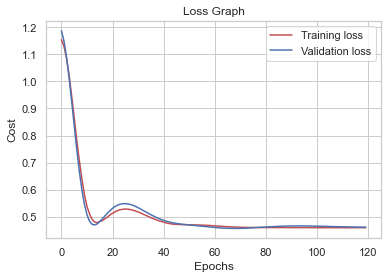

AUC Val: 0.840794325173885
AUC Train: 0.8497377120240535
Specificity: 0.8859912824345247
Sensitivity: 0.5799267449897844
Positive Predictive Value: 0.7272344592103194
Negative Predictive Value: 0.7935635210790801


(<__main__.DiabetesPredictor at 0x1eb3f5bbe80>,
 0.840794325173885,
 0.8859912824345247,
 0.5799267449897844,
 0.7272344592103194,
 0.7935635210790801,
 0.8497377120240535)

In [425]:
cross_val('rep_outliers_predictor', replaceOutliers=True, outliersColumnsMap={'BMI': [18.5, 50],'BloodPressure':[40,120],'SkinThickness': [0, np.Infinity], 'Pregnancies': [0, np.Infinity]})

#### Reemplazando Outliers y nulls

Fold 0


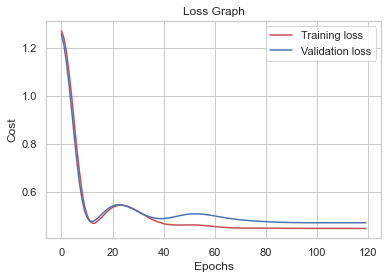

Fold 1


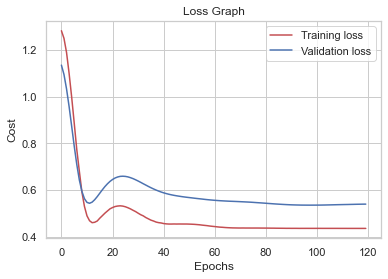

Fold 2


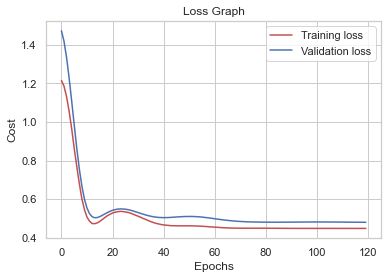

Fold 3


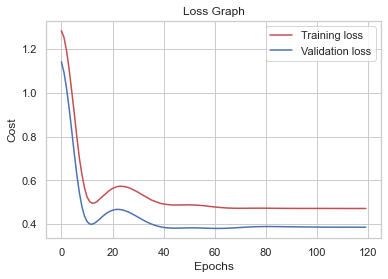

Fold 4


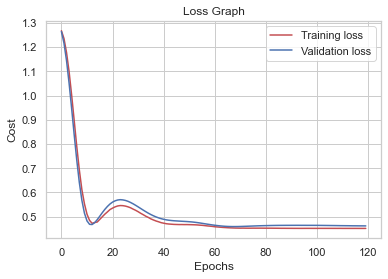

AUC Val: 0.8465122622425737
AUC Train: 0.853931851859075
Specificity: 0.8813173693965343
Sensitivity: 0.5835276451948506
Positive Predictive Value: 0.7207834628045162
Negative Predictive Value: 0.7929777424472579


(<__main__.DiabetesPredictor at 0x1eb46482bb0>,
 0.8465122622425737,
 0.8813173693965343,
 0.5835276451948506,
 0.7207834628045162,
 0.7929777424472579,
 0.853931851859075)

In [426]:
cross_val('rep_outliers_nulls_predictor',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], replaceOutliers=True, outliersColumnsMap={'BMI': [18.5, 50],'BloodPressure':[40,120],'SkinThickness': [0, np.Infinity], 'Pregnancies': [0, np.Infinity]})

Comparando los resultados anteriores, entre las tres alternativas, se obtuvieron los mejores resultados reemplazando los valores nulos por la mediana. Por esta razón, continuaremos el análisis con este factor.

#### Removiendo Columnas

BloodPressure
Fold 0


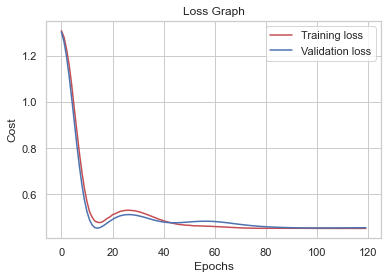

Fold 1


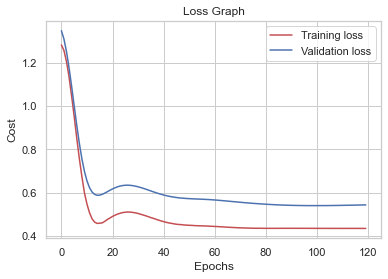

Fold 2


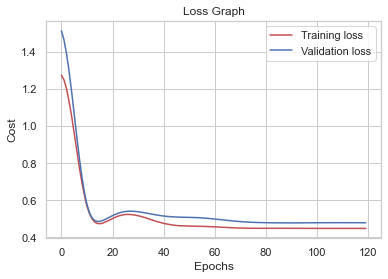

Fold 3


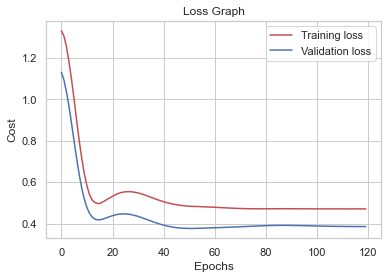

Fold 4


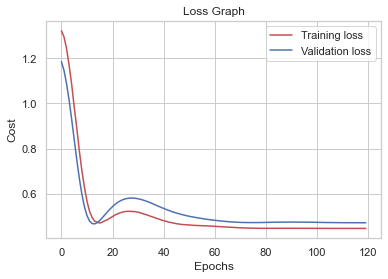

AUC Val: 0.8480305742584923
AUC Train: 0.8559248195400864
Specificity: 0.8884049215024092
Sensitivity: 0.575997600944698
Positive Predictive Value: 0.7307758233028352
Negative Predictive Value: 0.791984159904522
Age
Fold 0


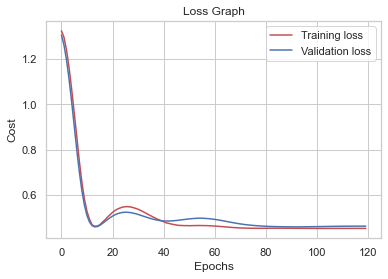

Fold 1


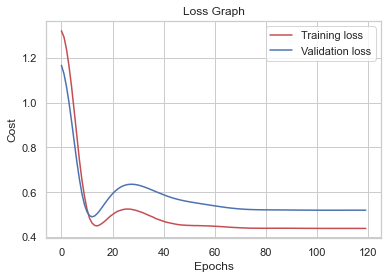

Fold 2


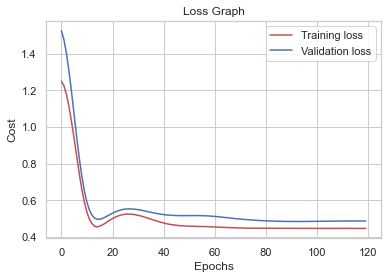

Fold 3


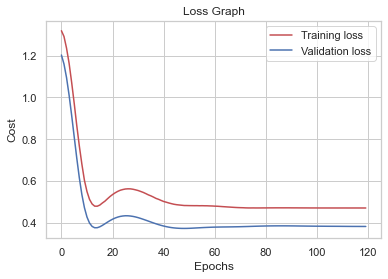

Fold 4


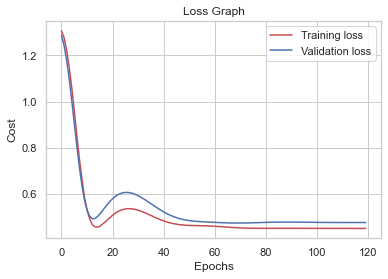

AUC Val: 0.8496856269172192
AUC Train: 0.8548725982651586
Specificity: 0.8807515564140054
Sensitivity: 0.5738764824274696
Positive Predictive Value: 0.7186420575689875
Negative Predictive Value: 0.7889163153598698
DiabetesPedigreeFunction
Fold 0


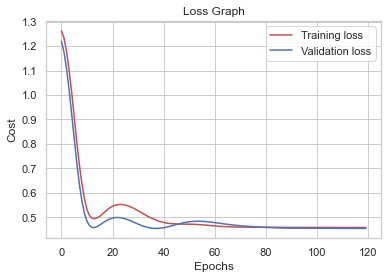

Fold 1


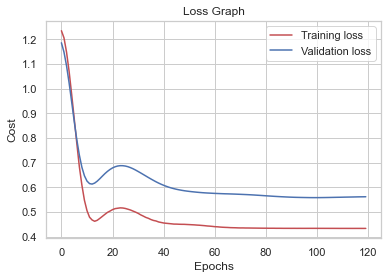

Fold 2


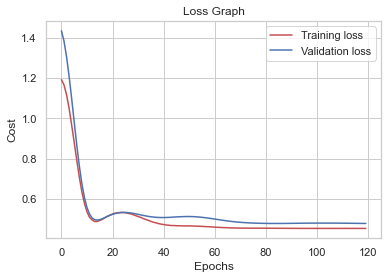

Fold 3


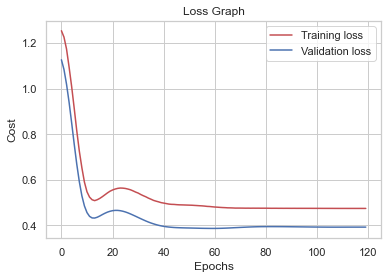

Fold 4


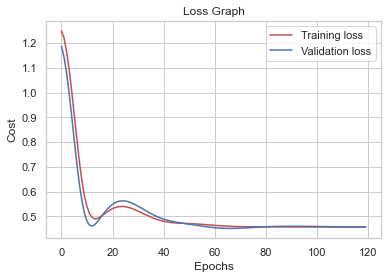

AUC Val: 0.8462843619562894
AUC Train: 0.8502863667113949
Specificity: 0.8759896516577695
Sensitivity: 0.5999435138340166
Positive Predictive Value: 0.7193018507274602
Negative Predictive Value: 0.7985676077224337
Pregnancies
Fold 0


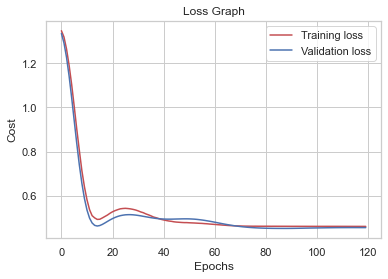

Fold 1


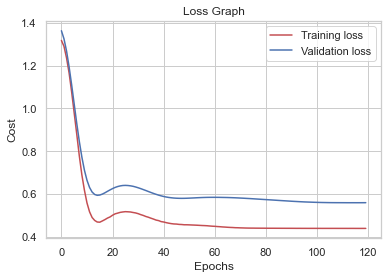

Fold 2


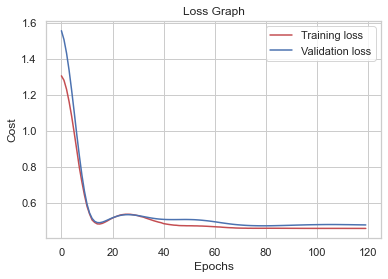

Fold 3


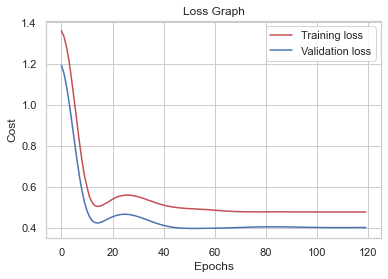

Fold 4


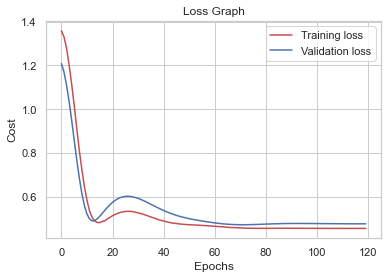

AUC Val: 0.8404820763105763
AUC Train: 0.848796503055753
Specificity: 0.8906651954725151
Sensitivity: 0.5999435138340166
Positive Predictive Value: 0.7431884243078539
Negative Predictive Value: 0.8011423751337053
SkinThickness
Fold 0


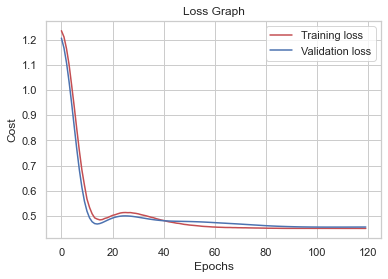

Fold 1


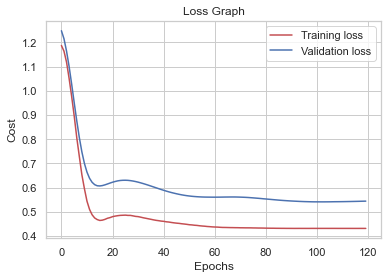

Fold 2


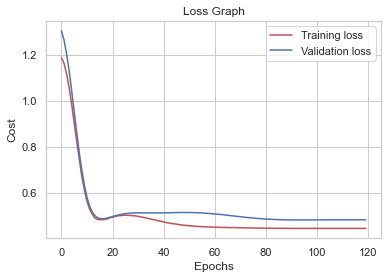

Fold 3


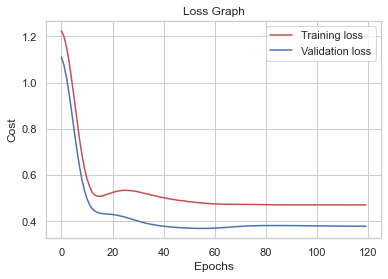

Fold 4


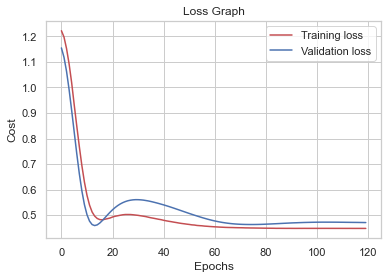

AUC Val: 0.8489520625372139
AUC Train: 0.8561503962598973
Specificity: 0.8807135046637299
Sensitivity: 0.5856487637120791
Positive Predictive Value: 0.7214010954020041
Negative Predictive Value: 0.7941387092999066


In [427]:
bestAuc = aucrepNull
tryRemovingCols = ['BloodPressure', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'SkinThickness']
removeCols = []
removeColsAuc = []
nullCols = ['Glucose','BloodPressure','SkinThickness','BMI']	
		
for col in tryRemovingCols:
	print(col)	
	remColPred, aucremCol, speremCol, senremCol, ppvremCol, npvremCol, aucTrainRemCol = cross_val('rem_col_predictor_' + col ,replaceNulls=True, nullColumns=nullCols, columnsToRemove=[col])
	if (aucremCol > bestAuc):
		removeCols.append(col)
		removeColsAuc.append(aucremCol)

In [428]:
print(removeCols)
print(removeColsAuc)

['Age', 'SkinThickness']
[0.8496856269172192, 0.8489520625372139]


Se observa que al eliminar la columna de Age o la columna de SkinThickness la métrica aumenta (aunque se mantiene en torno al mismo valor).

#### Eliminando las columnas (en conjunto) que superaron el valor anterior.

Fold 0


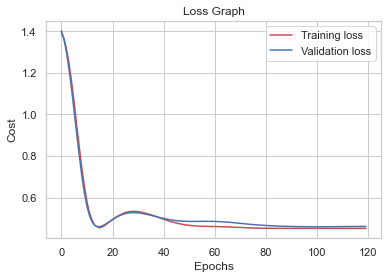

Fold 1


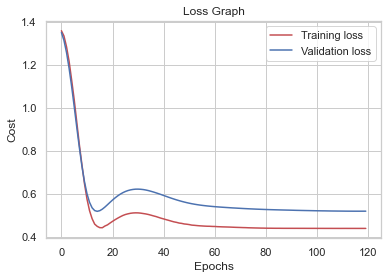

Fold 2


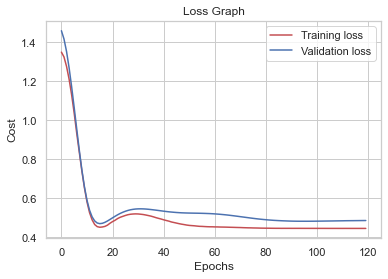

Fold 3


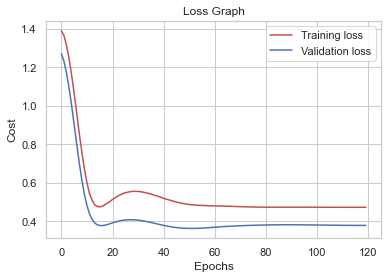

Fold 4


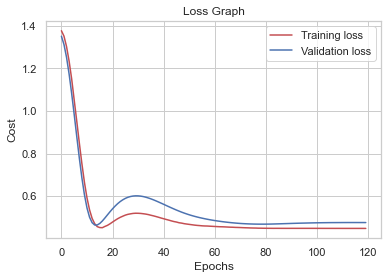

AUC Val: 0.8495607473485673
AUC Train: 0.8547089026730985
Specificity: 0.8826476916780759
Sensitivity: 0.5674248695450554
Positive Predictive Value: 0.7196453679578622
Negative Predictive Value: 0.7871375317479733


(<__main__.DiabetesPredictor at 0x1eb3d801e50>,
 0.8495607473485673,
 0.8826476916780759,
 0.5674248695450554,
 0.7196453679578622,
 0.7871375317479733,
 0.8547089026730985)

In [429]:
cross_val('rem_cols_predictor' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols)

### Features Polinomiales

1
Fold 0


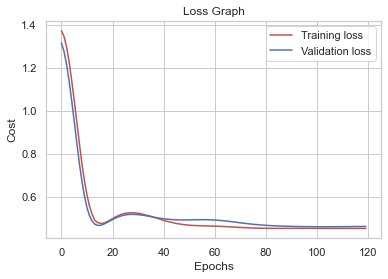

Fold 1


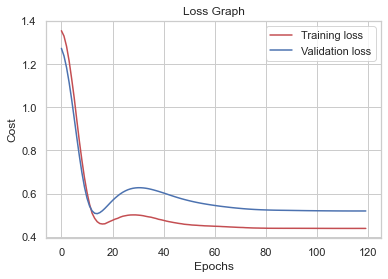

Fold 2


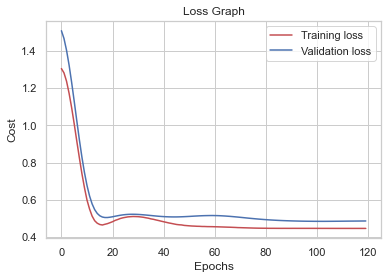

Fold 3


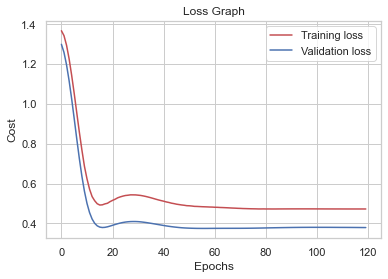

Fold 4


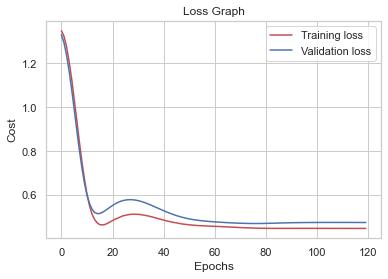

AUC Val: 0.8497198727600527
AUC Train: 0.8547813328137618
Specificity: 0.8826476916780759
Sensitivity: 0.5624248695575554
Positive Predictive Value: 0.7177514285566412
Negative Predictive Value: 0.7853697343318661
2
Fold 0


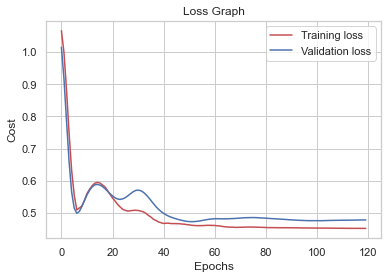

Fold 1


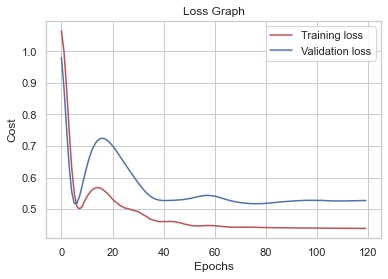

Fold 2


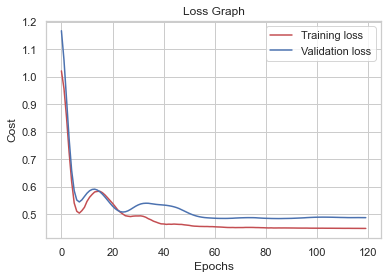

Fold 3


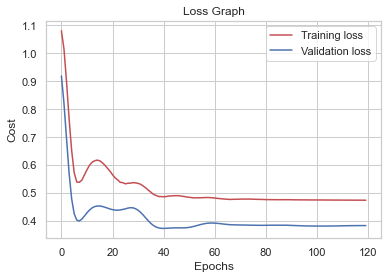

Fold 4


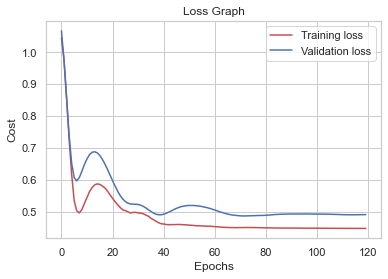

AUC Val: 0.8472464172478649
AUC Train: 0.8558395954803759
Specificity: 0.888046147856883
Sensitivity: 0.5649191696019598
Positive Predictive Value: 0.7272186452466661
Negative Predictive Value: 0.7882600284407093
3
Fold 0


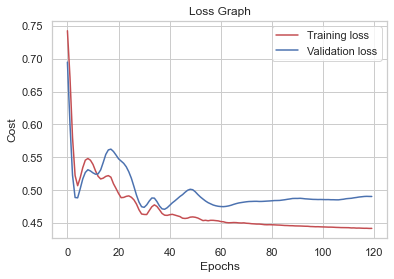

Fold 1


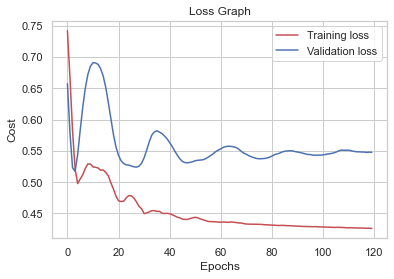

Fold 2


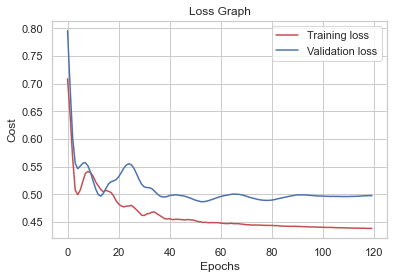

Fold 3


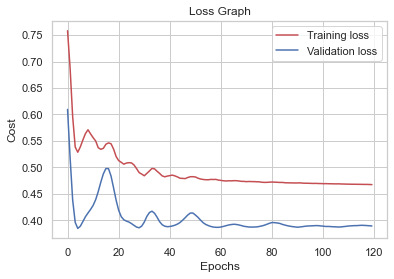

Fold 4


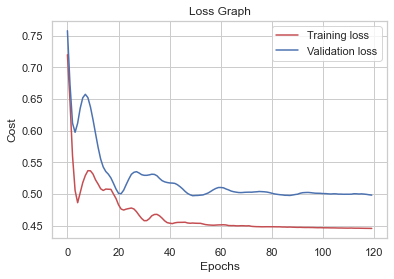

AUC Val: 0.8399821220297075
AUC Train: 0.8592075869250924
Specificity: 0.8743094659883862
Sensitivity: 0.5827623068164829
Positive Predictive Value: 0.7147557106624525
Negative Predictive Value: 0.7919341097073265
4
Fold 0


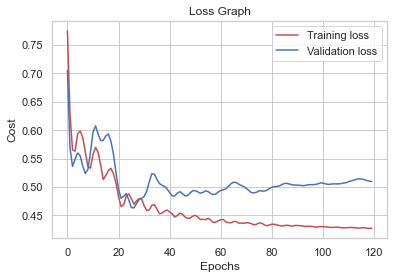

Fold 1


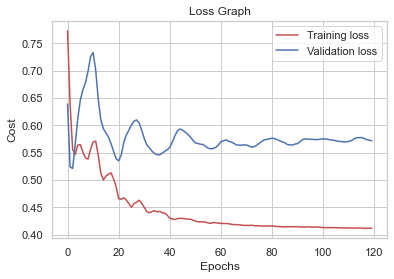

Fold 2


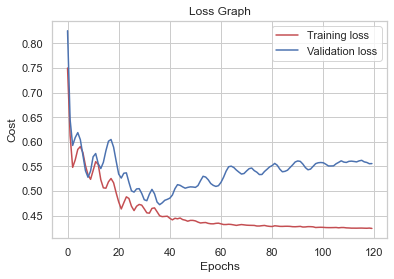

Fold 3


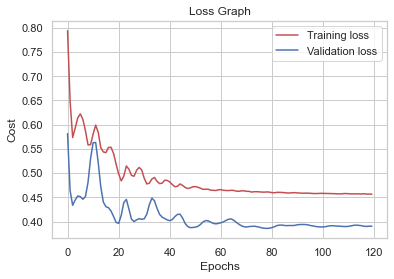

Fold 4


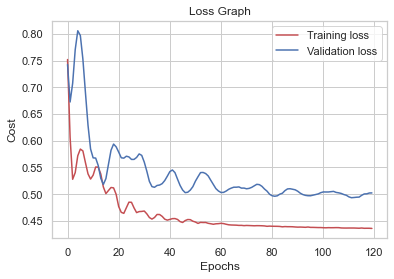

AUC Val: 0.829605926470405
AUC Train: 0.8648531238368999
Specificity: 0.856785405959679
Sensitivity: 0.6035444140390828
Positive Predictive Value: 0.6933121108310865
Negative Predictive Value: 0.7947109012053265


In [430]:
aucPolys = []
for i in range(1,5):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPol' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=i)
    aucPolys.append(aucPoly)

bestPolDeg = aucPolys.index(max(aucPolys)) + 1

In [431]:
print(aucPolys)

[0.8497198727600527, 0.8472464172478649, 0.8399821220297075, 0.829605926470405]


In [432]:
print('Best Degree: ' + str(bestPolDeg) + " --- AUC: " + str(max(aucPolys)))

Best Degree: 1 --- AUC: 0.8497198727600527


#### EarlyStopping + Features Polinomiales
Dado que en algunos de los gráficos anteriores se observó overfitting, se prueba EarlyStopping para evitarlo.

1
Fold 0


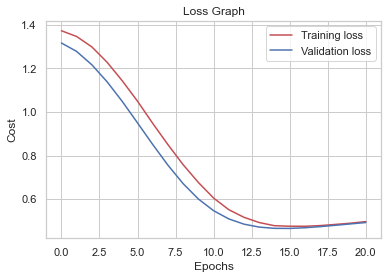

Fold 1


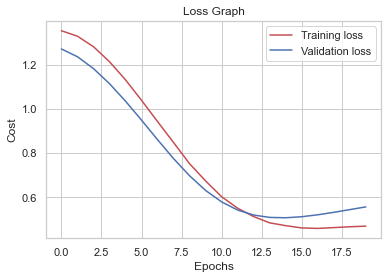

Fold 2


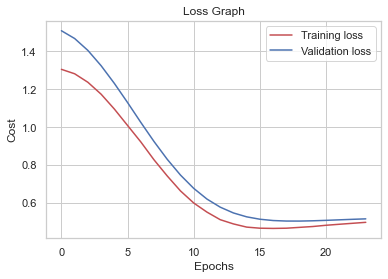

Fold 3


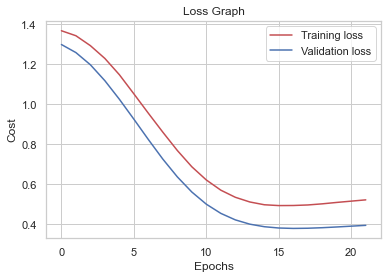

Fold 4


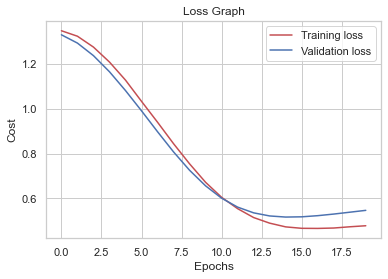

AUC Val: 0.8432395780622451
AUC Train: 0.8444886906637763
Specificity: 0.8174429449818728
Sensitivity: 0.6649488826670572
Positive Predictive Value: 0.6598899831587093
Negative Predictive Value: 0.814090049823253
2
Fold 0


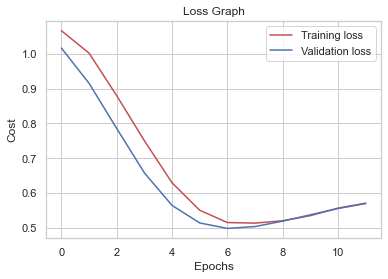

Fold 1


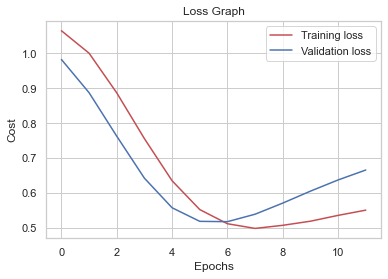

Fold 2


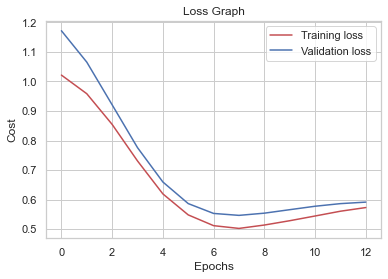

Fold 3


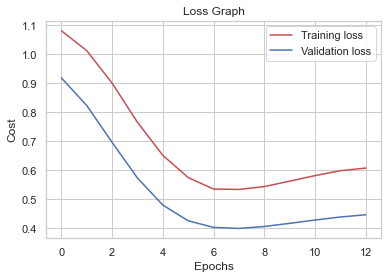

Fold 4


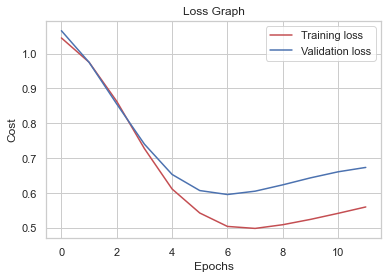

AUC Val: 0.8381506499741047
AUC Train: 0.8386761982227761
Specificity: 0.8140613024751484
Sensitivity: 0.6735216140667
Positive Predictive Value: 0.6591085197805965
Negative Predictive Value: 0.817074834993797
3
Fold 0


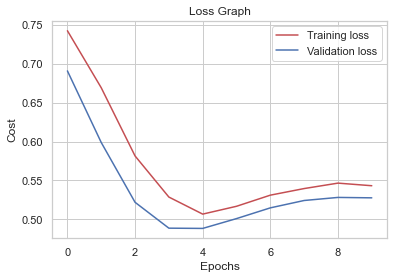

Fold 1


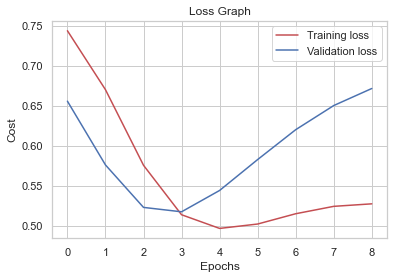

Fold 2


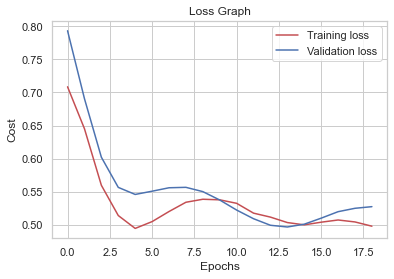

Fold 3


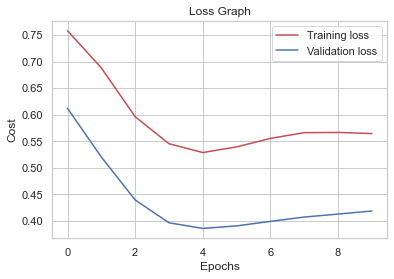

Fold 4


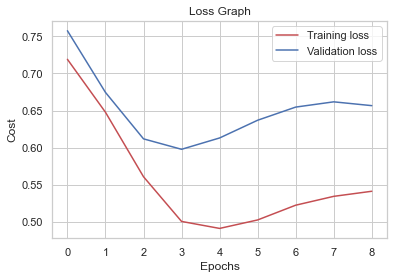

AUC Val: 0.8309754367874451
AUC Train: 0.838266002855811
Specificity: 0.838766271388485
Sensitivity: 0.6274020695976725
Positive Predictive Value: 0.6776351334052226
Negative Predictive Value: 0.8034800291732853


In [23]:
aucEarlyPolys = []
for i in range(1,4):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolEarly' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=i, earlyStop=True)
    aucEarlyPolys.append(aucPoly)

bestPolDeg = aucEarlyPolys.index(max(aucEarlyPolys)) + 1

In [24]:
print('Best Degree: ' + str(bestPolDeg) + " --- AUC: " + str(max(aucEarlyPolys)))

Best Degree: 1 --- AUC: 0.8432395780622451


Analizando los gráficos, se aprecia que el EarlyStopping no permite a la red iterar en más de 20 epochs, por lo que no resulta un método óptimo para mejorar la métrica.

### Regularización L1 y L2
#### Regularización L1

1
Fold 0


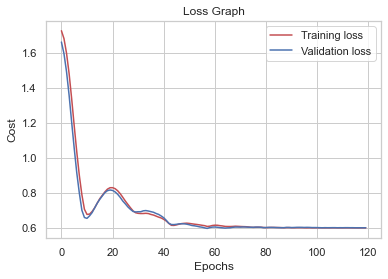

Fold 1


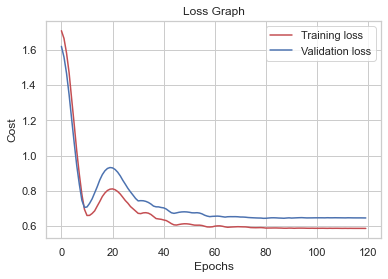

Fold 2


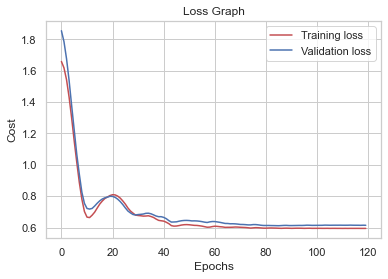

Fold 3


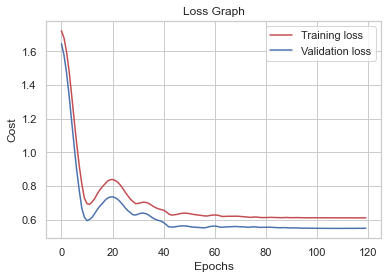

Fold 4


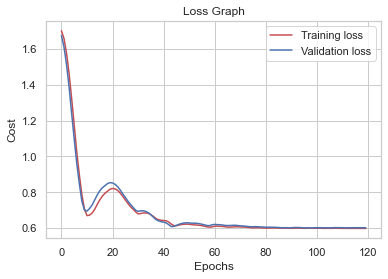

AUC Val: 0.8142695372461992
AUC Train: 0.8183403274528527
Specificity: 0.9407665170576596
Sensitivity: 0.39518423628482685
Positive Predictive Value: 0.7866931179264316
Negative Predictive Value: 0.741529034145274
2
Fold 0


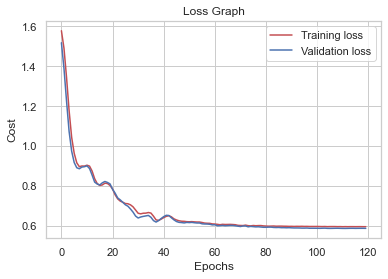

Fold 1


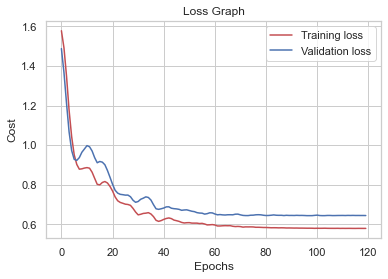

Fold 2


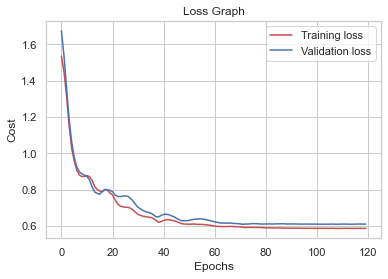

Fold 3


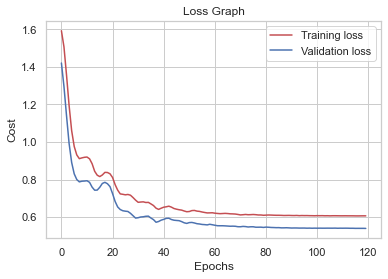

Fold 4


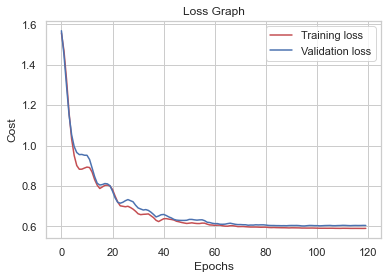

AUC Val: 0.8338230923303808
AUC Train: 0.8378717125796799
Specificity: 0.9348886088253143
Sensitivity: 0.4140982294417639
Positive Predictive Value: 0.7761274232648645
Negative Predictive Value: 0.7457032763523986
3
Fold 0


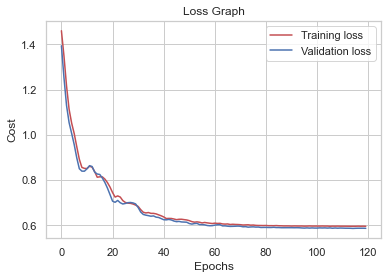

Fold 1


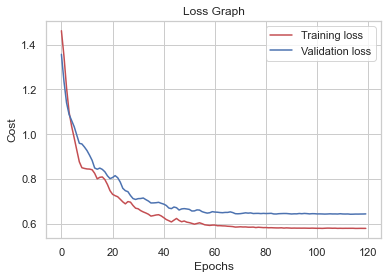

Fold 2


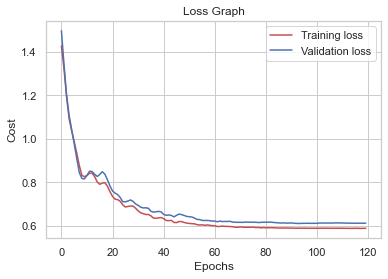

Fold 3


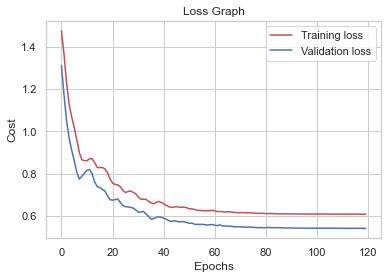

Fold 4


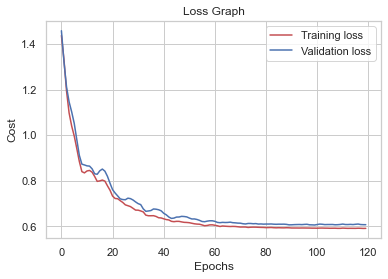

AUC Val: 0.8371104494450015
AUC Train: 0.8409906579362036
Specificity: 0.9403680608726027
Sensitivity: 0.4090982294542639
Positive Predictive Value: 0.7843916048325665
Negative Predictive Value: 0.7455627265013859
4
Fold 0


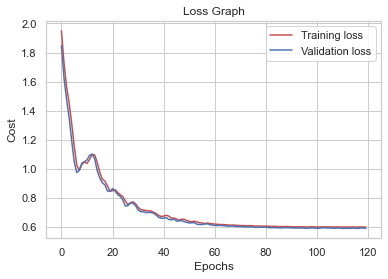

Fold 1


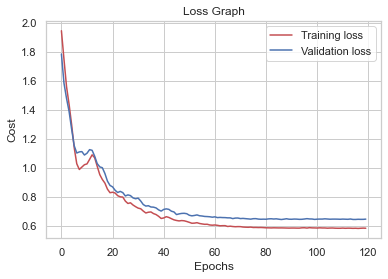

Fold 2


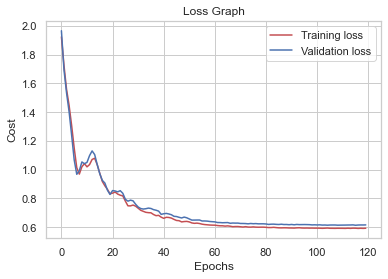

Fold 3


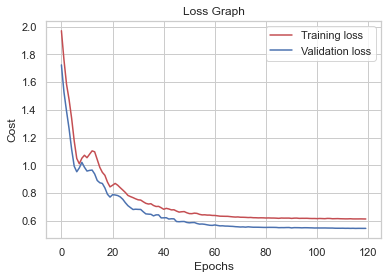

Fold 4


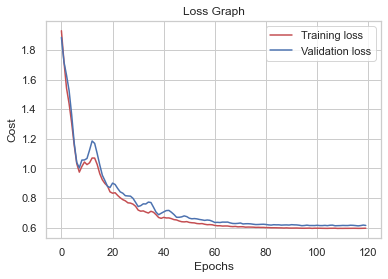

AUC Val: 0.8397324623945576
AUC Train: 0.8441493291072669
Specificity: 0.937590283098683
Sensitivity: 0.4094470666618829
Positive Predictive Value: 0.7772122579332132
Negative Predictive Value: 0.7449520831877736
5
Fold 0


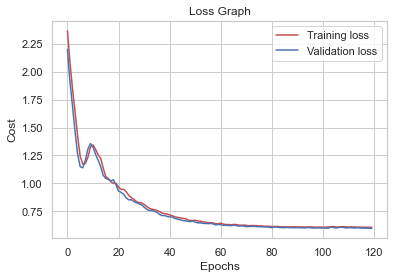

Fold 1


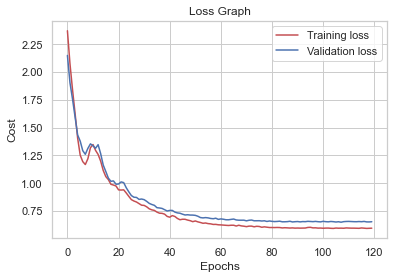

Fold 2


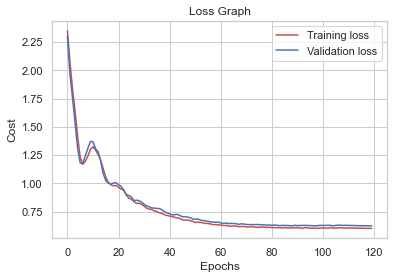

Fold 3


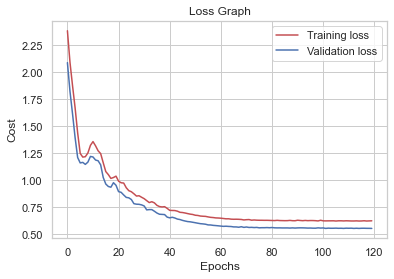

Fold 4


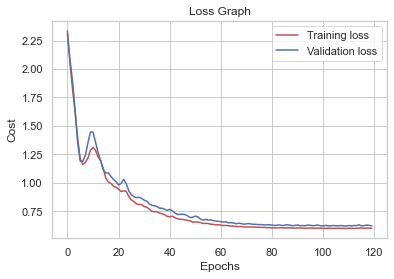

AUC Val: 0.8416381489288991
AUC Train: 0.846397834117132
Specificity: 0.937590283098683
Sensitivity: 0.42447141094393964
Positive Predictive Value: 0.783546664325736
Negative Predictive Value: 0.7495187572505208
6
Fold 0


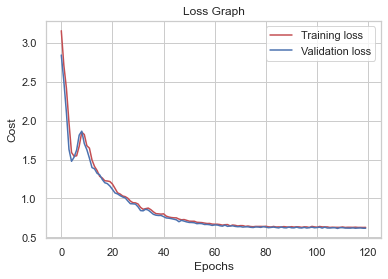

Fold 1


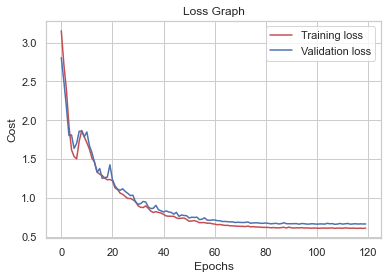

Fold 2


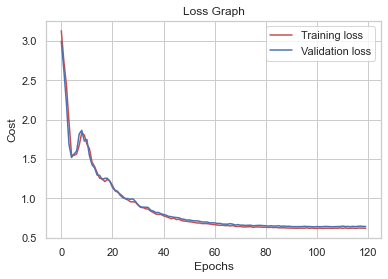

Fold 3


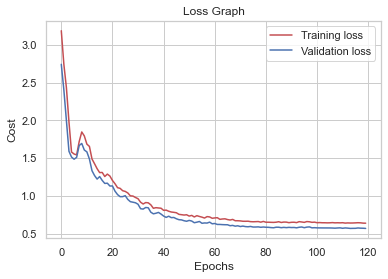

Fold 4


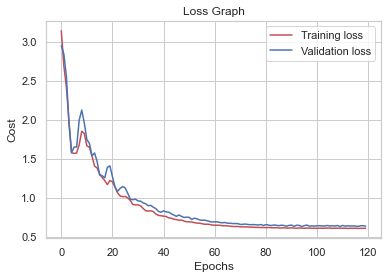

AUC Val: 0.8456928635511046
AUC Train: 0.8490164740257302
Specificity: 0.9274696047031707
Sensitivity: 0.44341732384575805
Positive Predictive Value: 0.7636923729100629
Negative Predictive Value: 0.7535890702093665
7
Fold 0


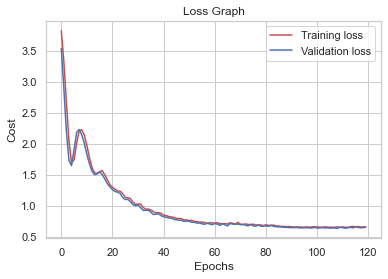

Fold 1


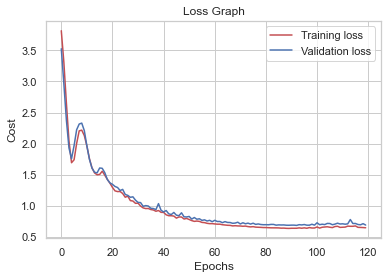

Fold 2


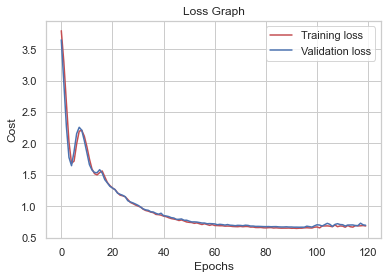

Fold 3


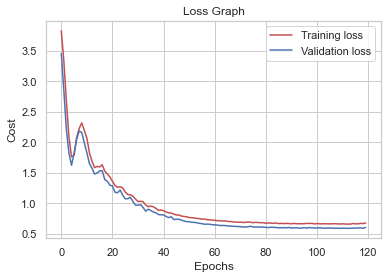

Fold 4


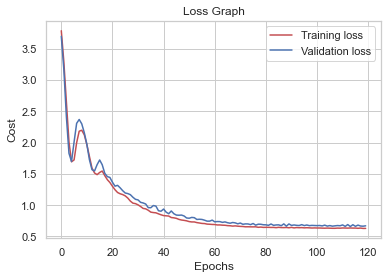

AUC Val: 0.84508360246827
AUC Train: 0.850025199235065
Specificity: 0.9351229697915745
Sensitivity: 0.4273221236212875
Positive Predictive Value: 0.776524213191085
Negative Predictive Value: 0.7503923123146627


In [435]:
aucReguPolys = []
for i in range(1,8):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolRegL1' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=i, regu='l1')
    aucReguPolys.append(aucPoly)

bestPolReguL1Deg = aucReguPolys.index(max(aucReguPolys)) + 1

In [436]:
print('Best Degree: ' + str(bestPolReguL1Deg) + " --- AUC: " + str(max(aucReguPolys)))

Best Degree: 6 --- AUC: 0.8456928635511046


#### Regularización L2

1
Fold 0


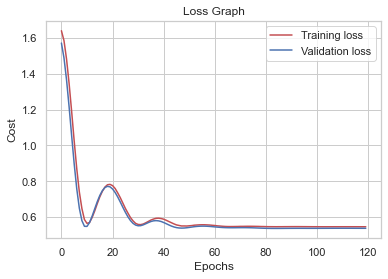

Fold 1


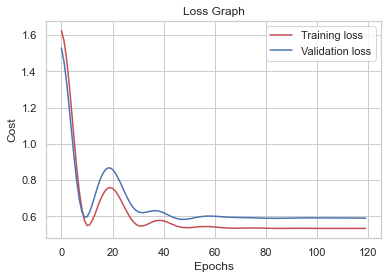

Fold 2


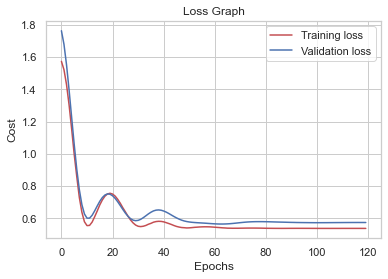

Fold 3


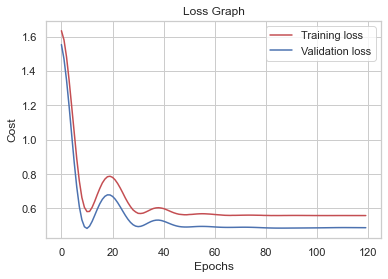

Fold 4


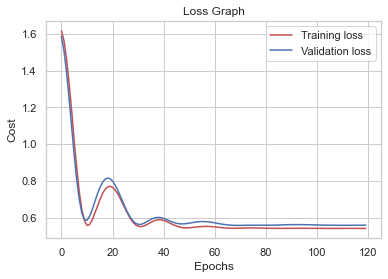

AUC Val: 0.8488242872130248
AUC Train: 0.8527903691586971
Specificity: 0.9301213390085696
Sensitivity: 0.4719900551954007
Positive Predictive Value: 0.7798721248377855
Negative Predictive Value: 0.7632423386245613
2
Fold 0


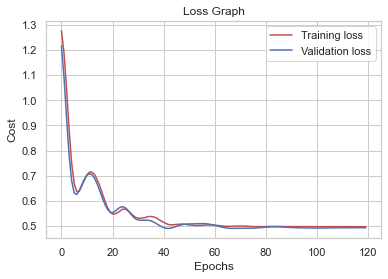

Fold 1


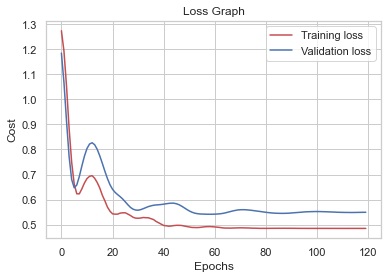

Fold 2


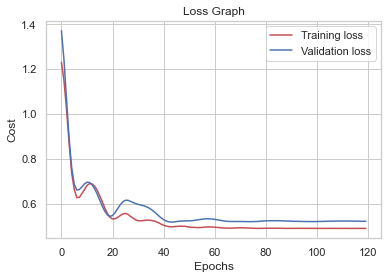

Fold 3


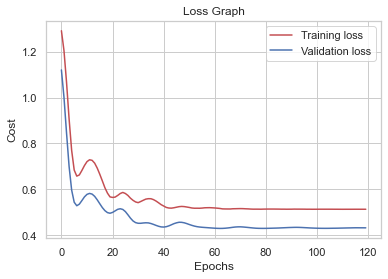

Fold 4


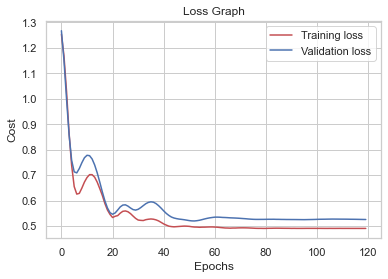

AUC Val: 0.8495085398720998
AUC Train: 0.8540090827111501
Specificity: 0.9132718821527088
Sensitivity: 0.5338277938883561
Positive Predictive Value: 0.7626785394416483
Negative Predictive Value: 0.7811430566696652
3
Fold 0


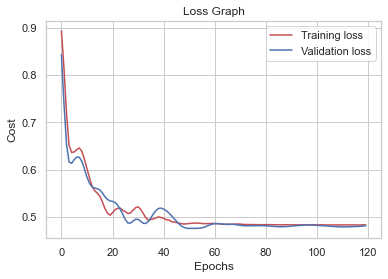

Fold 1


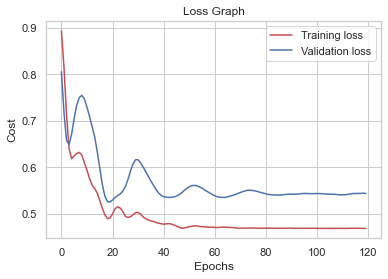

Fold 2


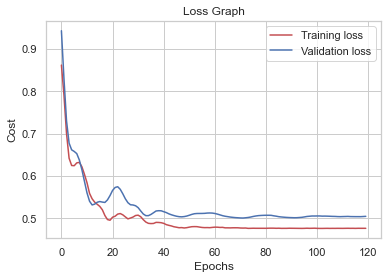

Fold 3


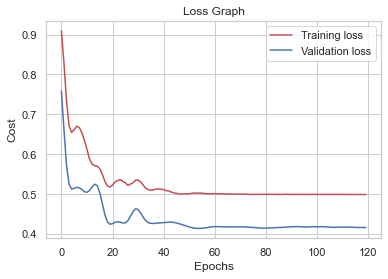

Fold 4


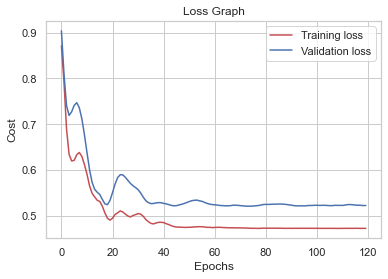

AUC Val: 0.8493142356161483
AUC Train: 0.8561067203961052
Specificity: 0.9129131085071827
Sensitivity: 0.5431301194481181
Positive Predictive Value: 0.7664494380962112
Negative Predictive Value: 0.7843416538811387
4
Fold 0


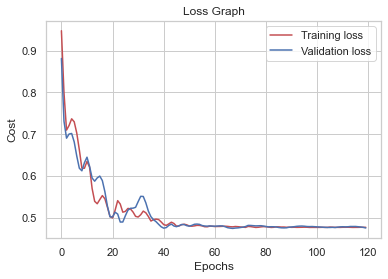

Fold 1


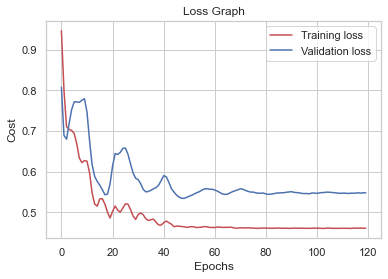

Fold 2


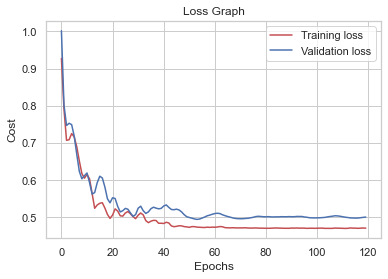

Fold 3


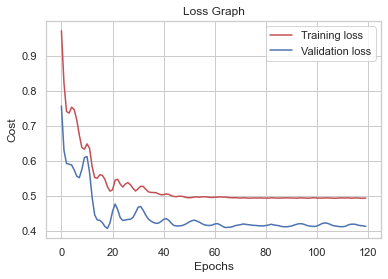

Fold 4


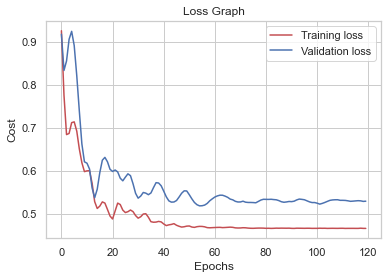

AUC Val: 0.8499269497857587
AUC Train: 0.8570214033889325
Specificity: 0.9004597869122675
Sensitivity: 0.5581544637301749
Positive Predictive Value: 0.7467676122160775
Negative Predictive Value: 0.7872431838789883
5
Fold 0


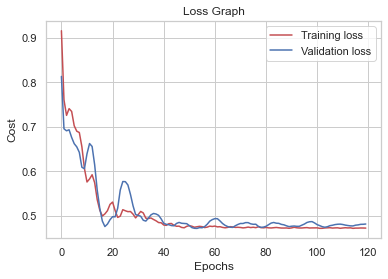

Fold 1


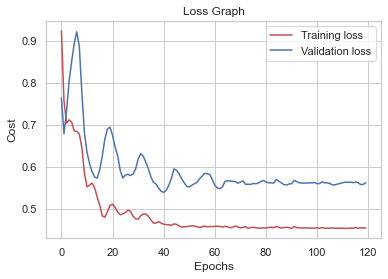

Fold 2


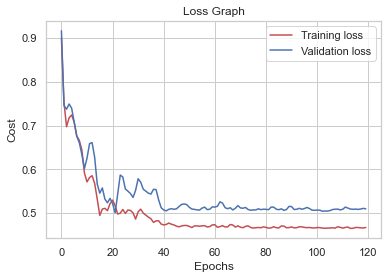

Fold 3


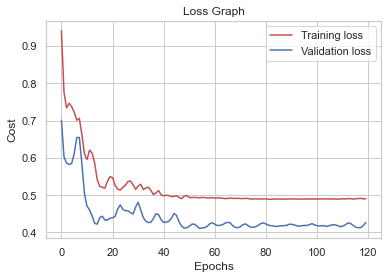

Fold 4


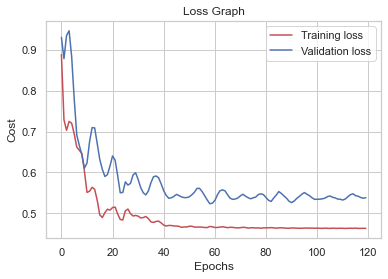

AUC Val: 0.8446573679027131
AUC Train: 0.8589051098826005
Specificity: 0.9010636516450719
Sensitivity: 0.5581544637301749
Positive Predictive Value: 0.7481818158171258
Negative Predictive Value: 0.7876096578412543


In [437]:
aucRegu2Polys = []
for i in range(1,6):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolRegL2' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=i, regu='l2')
    aucRegu2Polys.append(aucPoly)

bestPolReguL2Deg = aucRegu2Polys.index(max(aucRegu2Polys)) + 1

In [438]:
print('Best Degree: ' + str(bestPolReguL2Deg) + " --- AUC: " + str(max(aucRegu2Polys)))

Best Degree: 4 --- AUC: 0.8499269497857587


#### DropOut

Fold 0


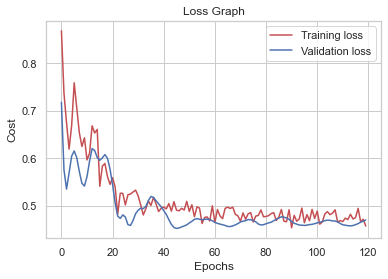

Fold 1


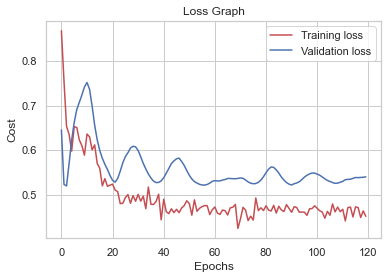

Fold 2


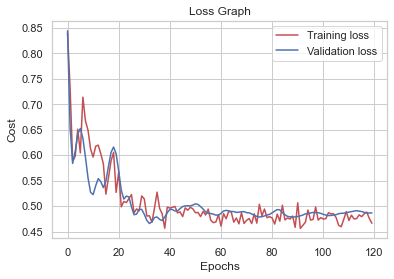

Fold 3


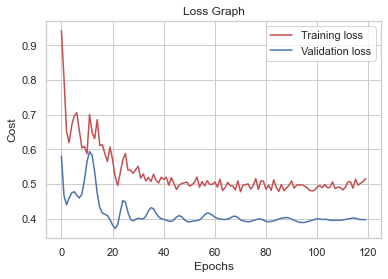

Fold 4


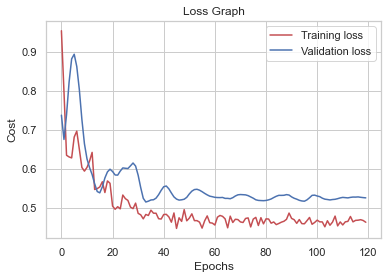

AUC Val: 0.8477457423575512
AUC Train: 0.8571006063876521
Specificity: 0.8928064218238637
Sensitivity: 0.5620760323499365
Positive Predictive Value: 0.7357037457348268
Negative Predictive Value: 0.7873573470043574


(<__main__.DiabetesPredictor at 0x1eb3d81a250>,
 0.8477457423575512,
 0.8928064218238637,
 0.5620760323499365,
 0.7357037457348268,
 0.7873573470043574,
 0.8571006063876521)

In [439]:
cross_val('dropOut' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=4, dropOut=True)

#### Batch Normalization

Fold 0


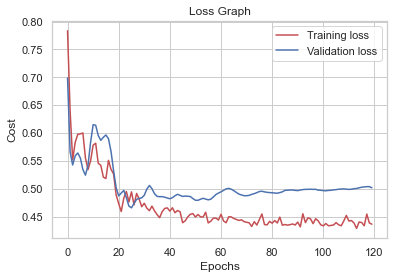

Fold 1


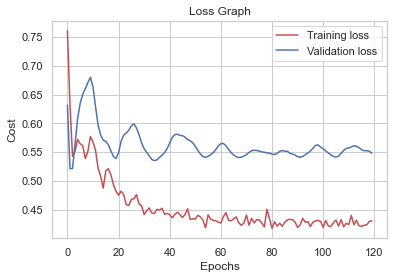

Fold 2


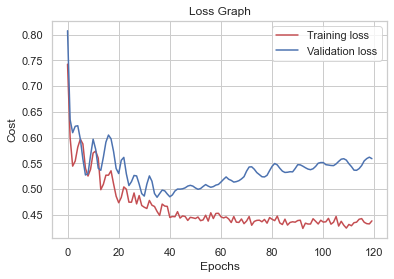

Fold 3


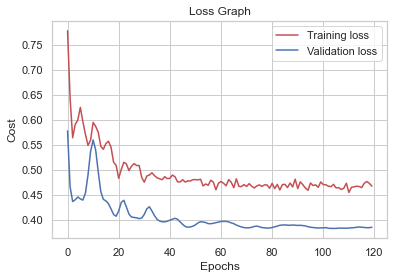

Fold 4


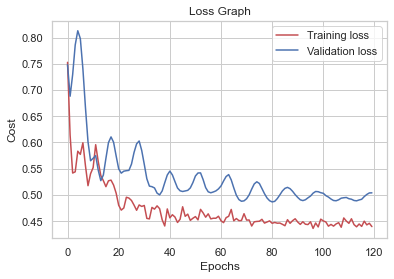

AUC Val: 0.8348569686236683
AUC Train: 0.8628935762517951
Specificity: 0.864406084358316
Sensitivity: 0.5989251710040832
Positive Predictive Value: 0.7030740290883213
Negative Predictive Value: 0.794707177566352


(<__main__.DiabetesPredictor at 0x1eb6292a280>,
 0.8348569686236683,
 0.864406084358316,
 0.5989251710040832,
 0.7030740290883213,
 0.794707177566352,
 0.8628935762517951)

In [440]:
cross_val("batch",replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  polyFeatDeg=4,batchNormalization=True)

Entre los métodos probados, los mejores resultados se obtuvieron aplicando regularización L2 con Features Polinomiales de grado 4. Sin embargo, como sucedió anteriormente, la métrica no mejoró considerablemente.

Fold 0


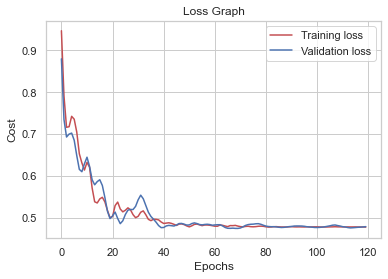

Fold 1


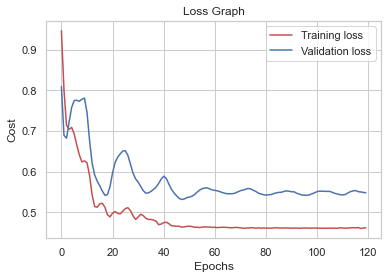

Fold 2


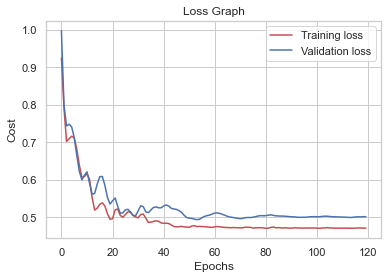

Fold 3


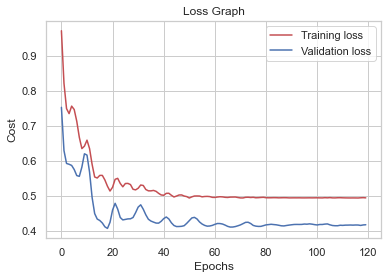

Fold 4


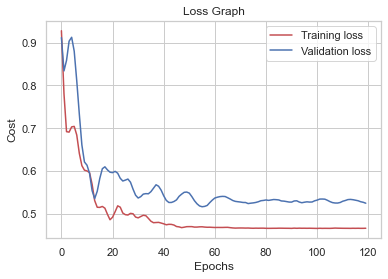

AUC Val: 0.8483141734169897
AUC Train: 0.857260440846721
Specificity: 0.9077543783551448
Sensitivity: 0.5535033009502939
Positive Predictive Value: 0.7593759030790974
Negative Predictive Value: 0.7867810543513352


(<__main__.DiabetesPredictor at 0x1e0b2f5cf70>,
 0.8483141734169897,
 0.9077543783551448,
 0.5535033009502939,
 0.7593759030790974,
 0.7867810543513352,
 0.857260440846721)

In [27]:
cross_val('l2' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,polyFeatDeg=bestPolReguL2Deg, regu="l2")

### Variación del learning rate

1e-05
Fold 0


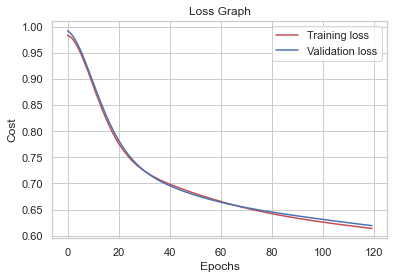

Fold 1


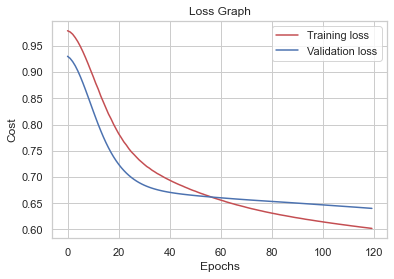

Fold 2


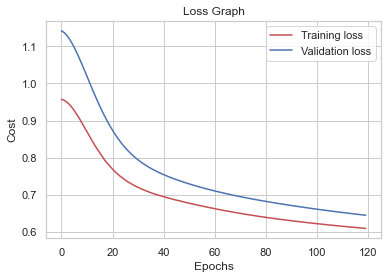

Fold 3


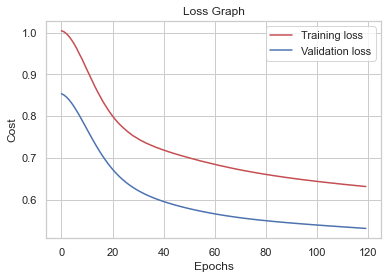

Fold 4


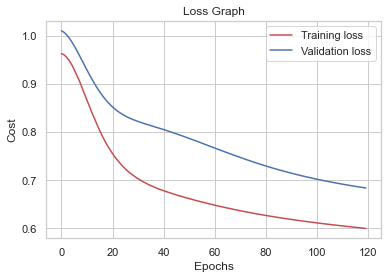

AUC Val: 0.8343330772171713
AUC Train: 0.8389766679685404
Specificity: 0.9087982962204574
Sensitivity: 0.5033945238983752
Positive Predictive Value: 0.753456218485723
Negative Predictive Value: 0.7710282871778193
0.0001
Fold 0


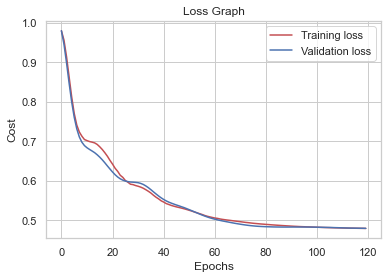

Fold 1


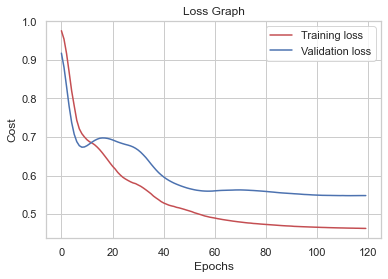

Fold 2


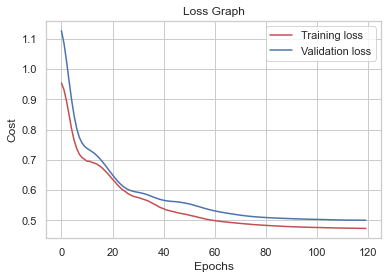

Fold 3


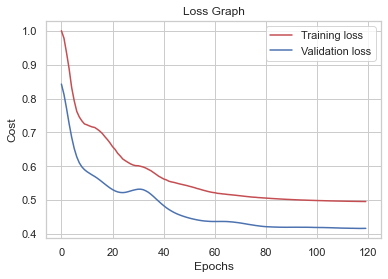

Fold 4


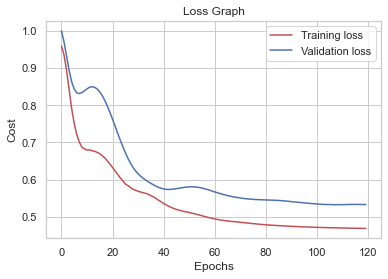

AUC Val: 0.8487440791569328
AUC Train: 0.8574011750184628
Specificity: 0.9077543783551448
Sensitivity: 0.5517028508477607
Positive Predictive Value: 0.758774652476402
Negative Predictive Value: 0.7866971908463912
0.001
Fold 0


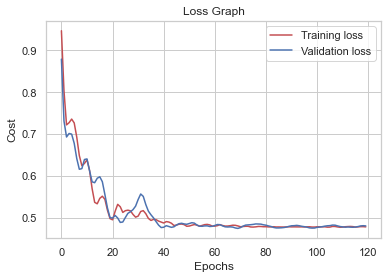

Fold 1


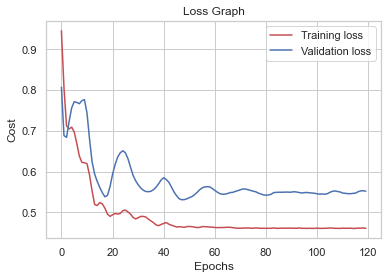

Fold 2


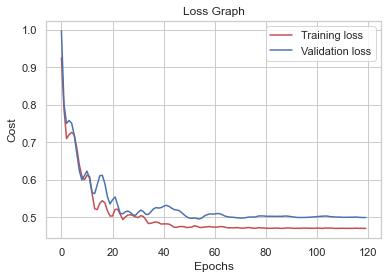

Fold 3


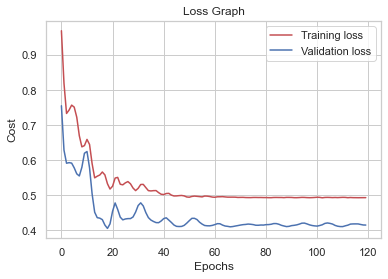

Fold 4


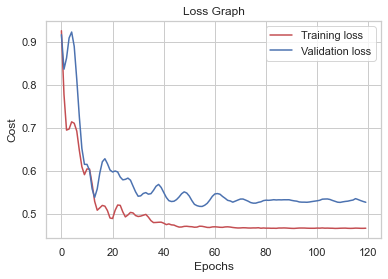

AUC Val: 0.8470320689017292
AUC Train: 0.8573589334059852
Specificity: 0.905373425977027
Sensitivity: 0.5488521381704128
Positive Predictive Value: 0.752935413669215
Negative Predictive Value: 0.7846355033275387
0.01
Fold 0


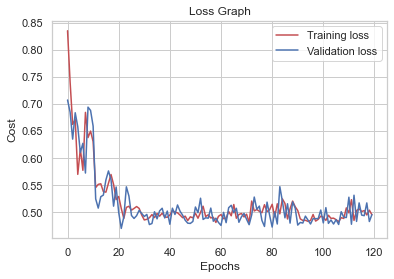

Fold 1


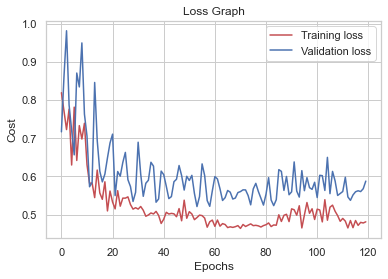

Fold 2


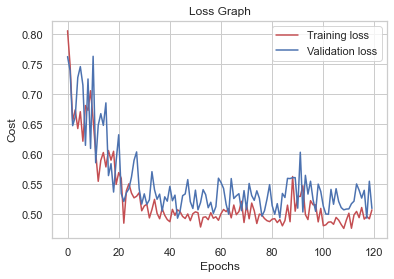

Fold 3


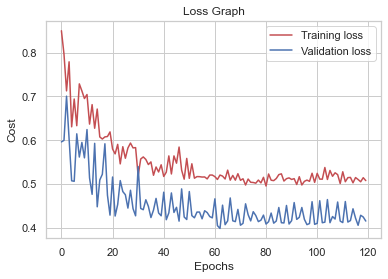

Fold 4


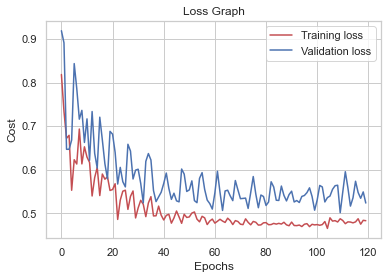

AUC Val: 0.8389315300934912
AUC Train: 0.8475290150700591
Specificity: 0.899345414225413
Sensitivity: 0.5570760323624364
Positive Predictive Value: 0.7490339642420164
Negative Predictive Value: 0.7866321304698344
0.1
Fold 0


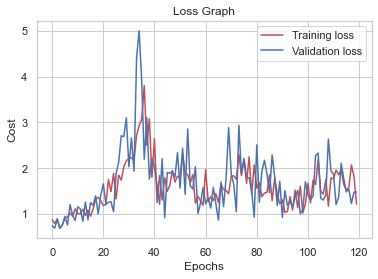

Fold 1


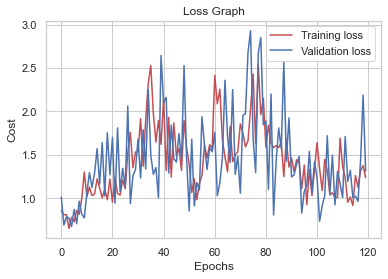

Fold 2


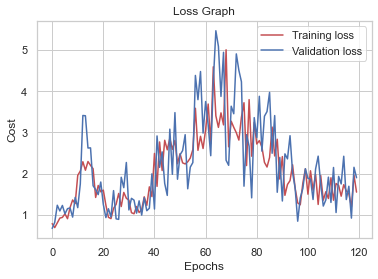

Fold 3


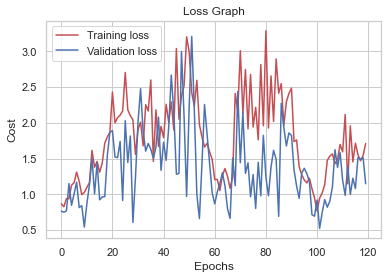

Fold 4


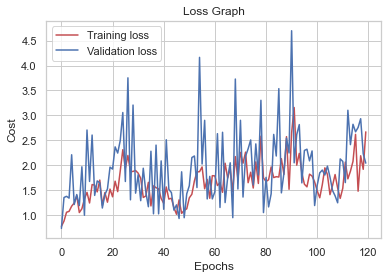

AUC Val: 0.7270347104926305
AUC Train: 0.7147102909086933
Specificity: 0.7801077256518077
Sensitivity: 0.5761968418821293
Positive Predictive Value: 0.5887370396943197
Negative Predictive Value: 0.766252921342708
1
Fold 0


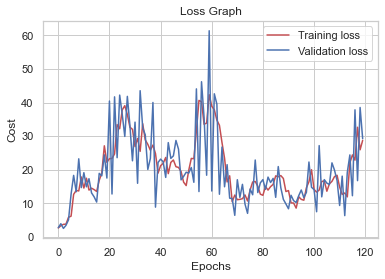

Fold 1


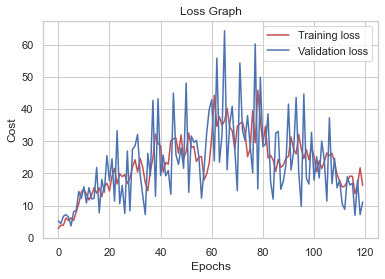

Fold 2


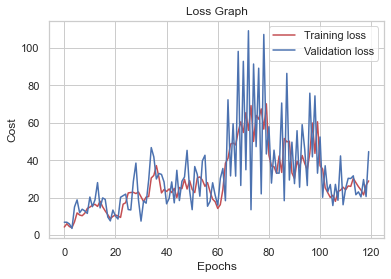

Fold 3


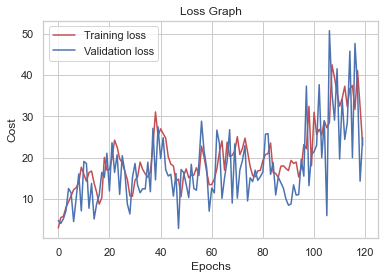

Fold 4


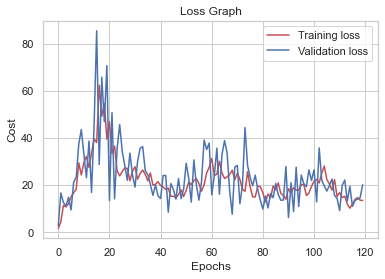

AUC Val: 0.7103856392217783
AUC Train: 0.7069793465672177
Specificity: 0.8161241327582447
Sensitivity: 0.5012041233744341
Positive Predictive Value: 0.6039057293076672
Negative Predictive Value: 0.7526966224265085


In [442]:
aucLrPolys = []
lrs = [1e-5, 1e-4, 1e-3, 1e-2, 0.1, 1]
for lr in lrs:
    print(lr)
    lrPred, aucLr, speLr, senLr, ppvLr, npvLr, aucTrainLr = cross_val('changeLr'+str(lr) ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=lr)
    aucLrPolys.append(aucLr)

bestLr = lrs[aucLrPolys.index(max(aucLrPolys))]

In [443]:
print('Best LR: ' + str(bestLr) + " --- AUC: " + str(max(aucLrPolys)))

Best LR: 0.0001 --- AUC: 0.8487440791569328


### Variación del momentum

0.9
Fold 0


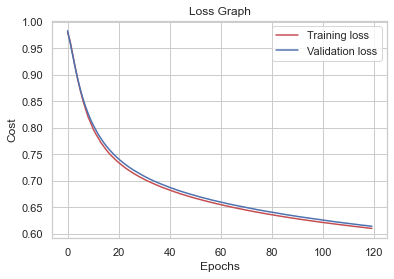

Fold 1


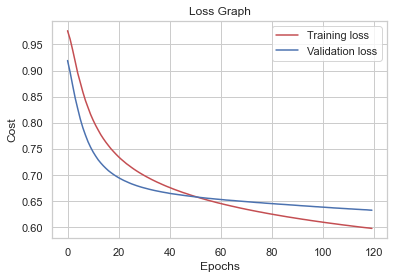

Fold 2


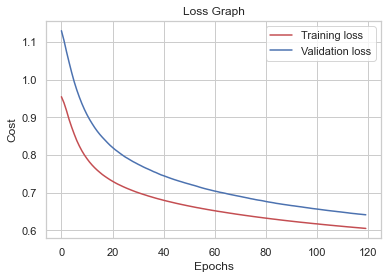

Fold 3


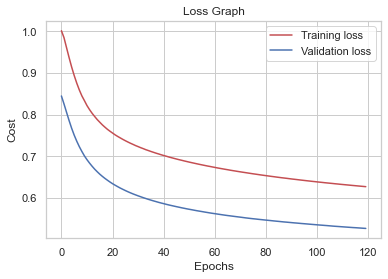

Fold 4


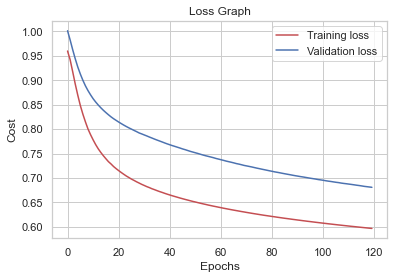

AUC Val: 0.8338044035226723
AUC Train: 0.8386196261694069
Specificity: 0.9085205184434126
Sensitivity: 0.501942911003461
Positive Predictive Value: 0.7519999972878333
Negative Predictive Value: 0.7708634399494223
0.99
Fold 0


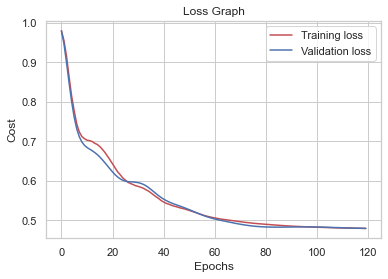

Fold 1


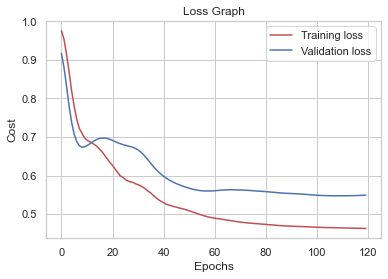

Fold 2


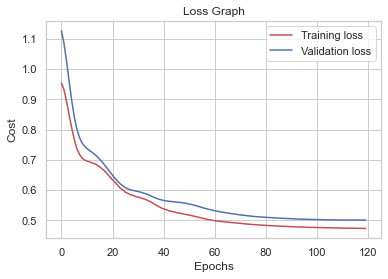

Fold 3


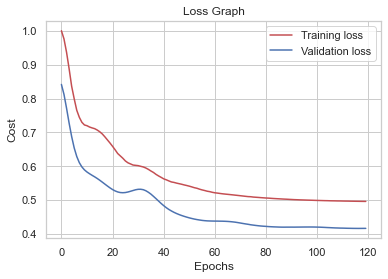

Fold 4


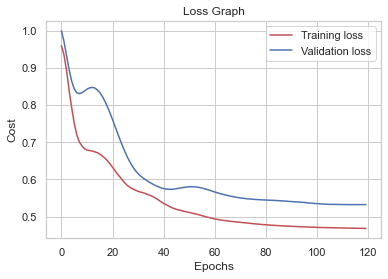

AUC Val: 0.8489540785289137
AUC Train: 0.8573684466700181
Specificity: 0.9077543783551448
Sensitivity: 0.5517028508477607
Positive Predictive Value: 0.758774652476402
Negative Predictive Value: 0.7866971908463912
0.999
Fold 0


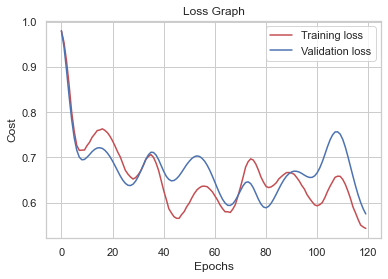

Fold 1


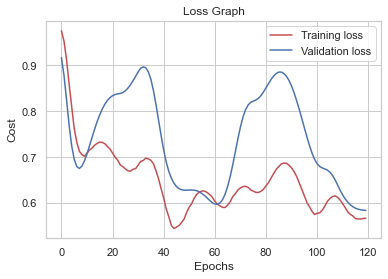

Fold 2


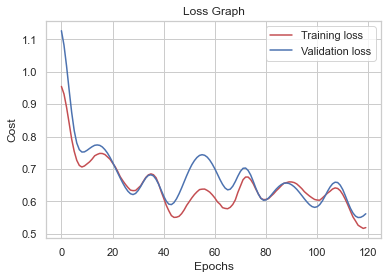

Fold 3


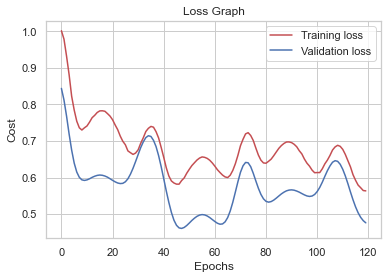

Fold 4


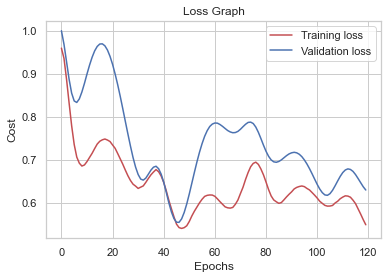

AUC Val: 0.8343082685057677
AUC Train: 0.8397533901492913
Specificity: 0.8834585957478829
Sensitivity: 0.5595741568802076
Positive Predictive Value: 0.7161853331659501
Negative Predictive Value: 0.7843851419971591


In [444]:
aucsMom = []
moms = [0.9, 0.99, 0.999]
for mom in moms:
    print(mom)
    momPred, aucMom, speMom, senMom, ppvMom, npvMom, aucTrainMom = cross_val('changeMom'+str(lr) ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=mom)
    aucsMom.append(aucMom)

bestMom = moms[aucsMom.index(max(aucsMom))]

In [445]:
print('Best Mom: ' + str(bestMom) + " --- AUC: " + str(max(aucsMom)))

Best Mom: 0.99 --- AUC: 0.8489540785289137


### Variación del learning rate decay

0.001
Fold 0


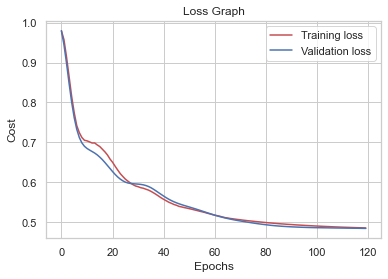

Fold 1


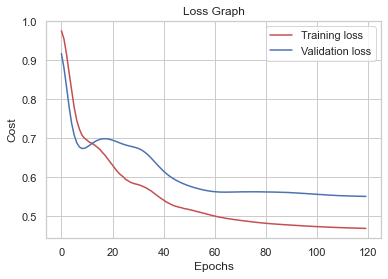

Fold 2


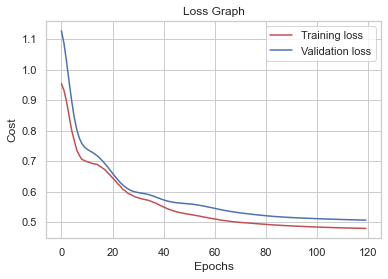

Fold 3


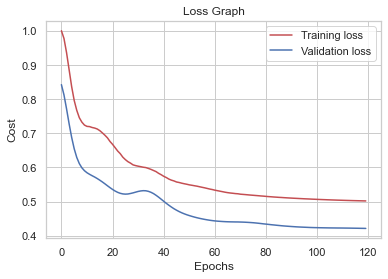

Fold 4


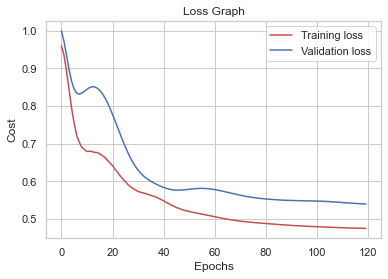

AUC Val: 0.8485033902137576
AUC Train: 0.8571337006323312
Specificity: 0.9077543783551448
Sensitivity: 0.5517028508477607
Positive Predictive Value: 0.758774652476402
Negative Predictive Value: 0.7866971908463912
0.0001
Fold 0


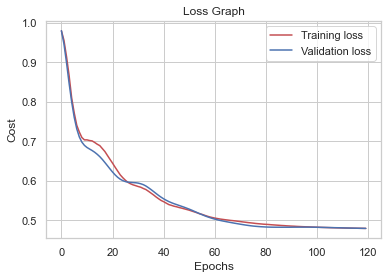

Fold 1


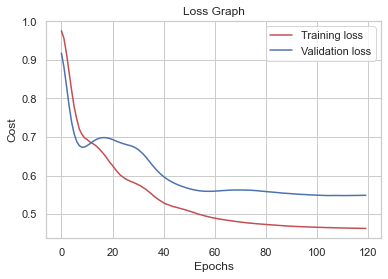

Fold 2


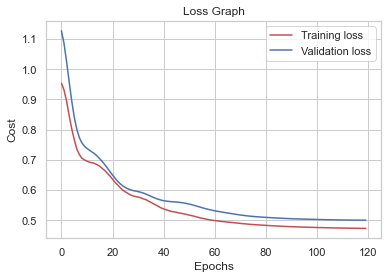

Fold 3


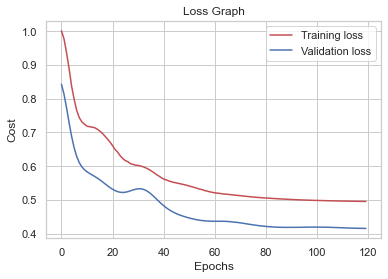

Fold 4


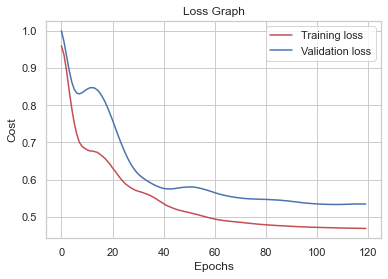

AUC Val: 0.848875708679682
AUC Train: 0.8574129787128936
Specificity: 0.9077543783551448
Sensitivity: 0.5517028508477607
Positive Predictive Value: 0.758774652476402
Negative Predictive Value: 0.7866971908463912
1e-05
Fold 0


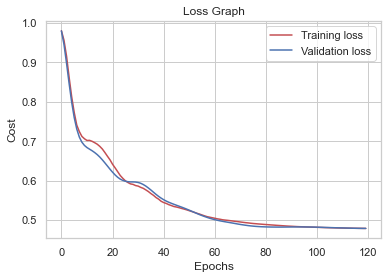

Fold 1


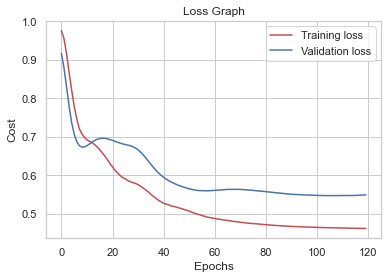

Fold 2


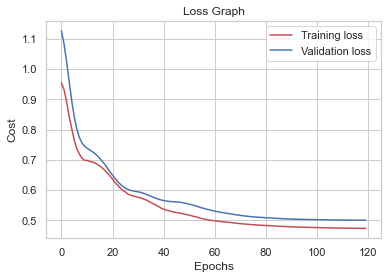

Fold 3


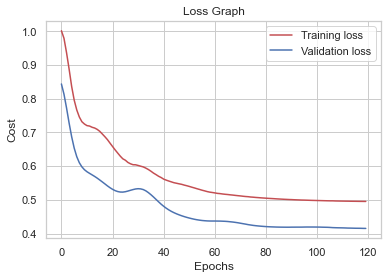

Fold 4


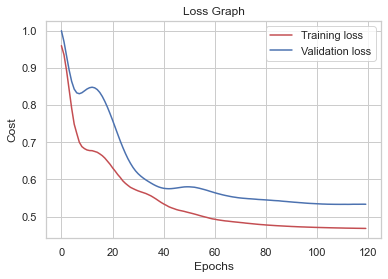

AUC Val: 0.848574527805593
AUC Train: 0.8574923325994181
Specificity: 0.905373425977027
Sensitivity: 0.5517028508477607
Positive Predictive Value: 0.7539470663022442
Negative Predictive Value: 0.7862716589301585


In [446]:
aucsDecays = []
decays = [1e-3, 1e-4, 1e-5]
for dec in decays:
    print(dec)
    decPred, aucDec, speDec, senDec, ppvDec, npvDec, aucTrainDec = cross_val("changeDec"+str(dec),replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=dec)
    aucsDecays.append(aucDec)

bestDec = decays[aucsDecays.index(max(aucsDecays))]

In [447]:
print('Best Decay: ' + str(bestDec) + " --- AUC: " + str(max(aucsDecays)))

Best Decay: 0.0001 --- AUC: 0.848875708679682


Se vuelvo a entrenar con los parámetros hallados:

Fold 0


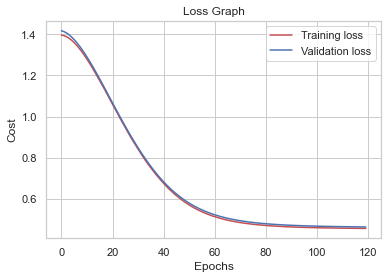

Fold 1


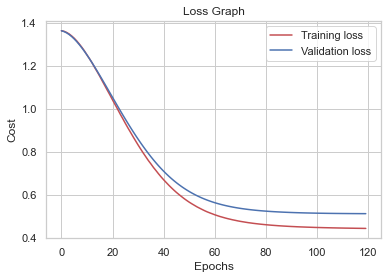

Fold 2


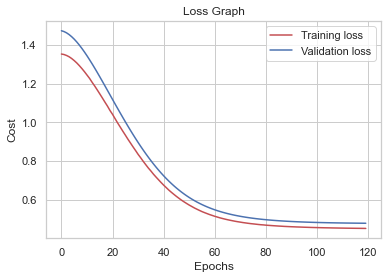

Fold 3


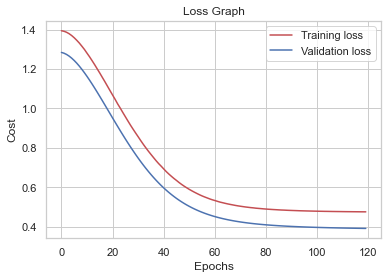

Fold 4


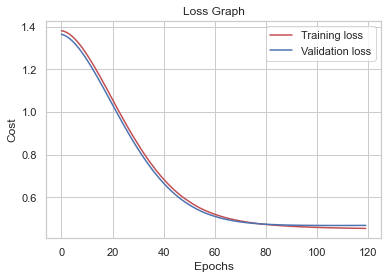

AUC Val: 0.8502911665177342
AUC Train: 0.8542780234430991
Specificity: 0.8903771602670307
Sensitivity: 0.5645459880747838
Positive Predictive Value: 0.7338547182956308
Negative Predictive Value: 0.7884057554393782


(<__main__.DiabetesPredictor at 0x1eb73ba35e0>,
 0.8502911665177342,
 0.8903771602670307,
 0.5645459880747838,
 0.7338547182956308,
 0.7884057554393782,
 0.8542780234430991)

In [448]:
cross_val("withoutReg",replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, learning_rate=bestLr, momentum=bestMom, decay=bestDec)

### Multilayer

Fold 0


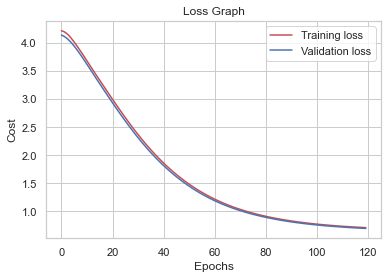

Fold 1


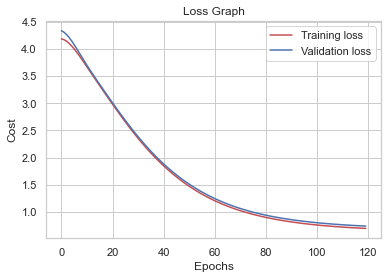

Fold 2


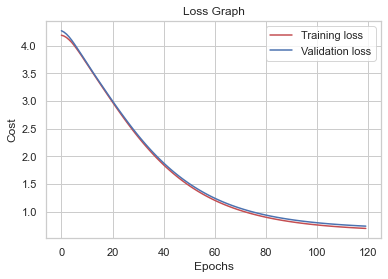

Fold 3


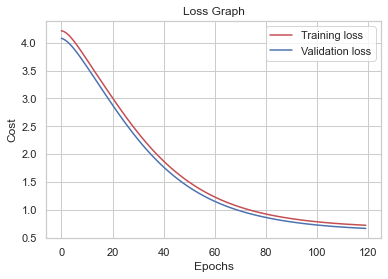

Fold 4


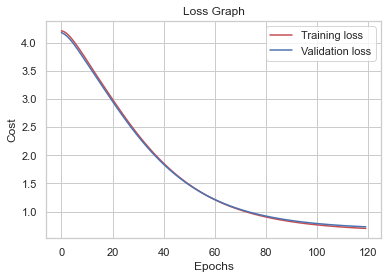

AUC Val: 0.8320222609222274
AUC Train: 0.8334297825153355
Specificity: 0.9787163548756814
Sensitivity: 0.23585822868811804
Positive Predictive Value: 0.8621212044321054
Negative Predictive Value: 0.7029325462896454


(<__main__.DiabetesPredictor at 0x1eb72c54eb0>,
 0.8320222609222274,
 0.9787163548756814,
 0.23585822868811804,
 0.8621212044321054,
 0.7029325462896454,
 0.8334297825153355)

In [449]:
cross_val('multi',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [12,8] )

Se aumenta el número de neuronas en cada capa.

Fold 0


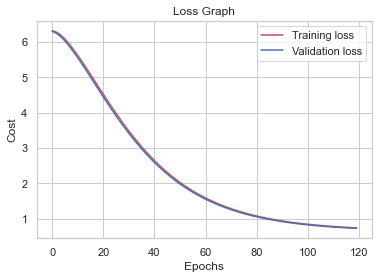

Fold 1


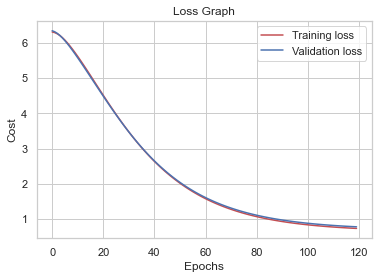

Fold 2


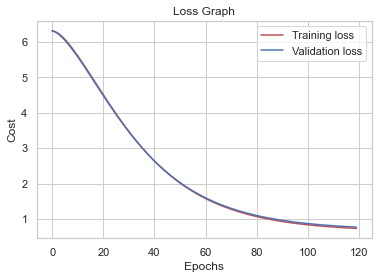

Fold 3


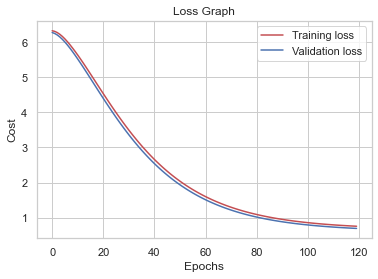

Fold 4


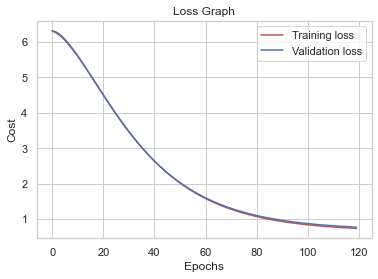

AUC Val: 0.8343246094230545
AUC Train: 0.8367474921527552
Specificity: 0.9628003949055606
Sensitivity: 0.3040874917256824
Positive Predictive Value: 0.8130524978402602
Negative Predictive Value: 0.7184757334447128


(<__main__.DiabetesPredictor at 0x1eb72187ca0>,
 0.8343246094230545,
 0.9628003949055606,
 0.3040874917256824,
 0.8130524978402602,
 0.7184757334447128,
 0.8367474921527552)

In [450]:
cross_val('multi2',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20] )

Se prueba sin regularización

Fold 0


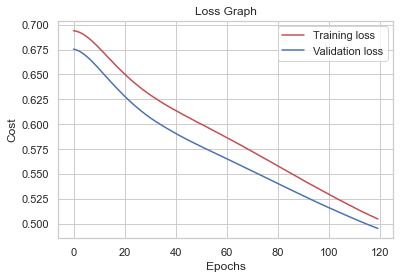

Fold 1


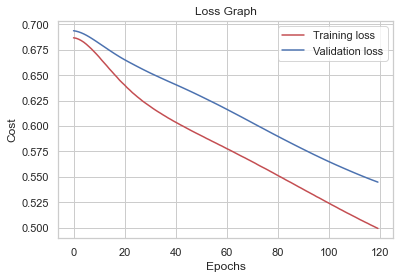

Fold 2


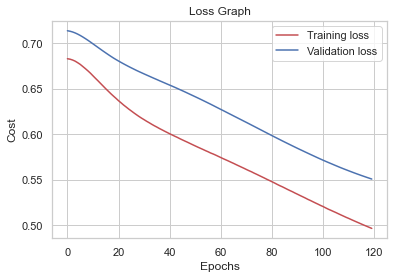

Fold 3


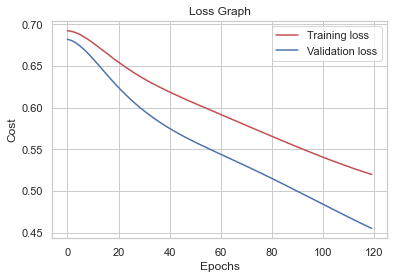

Fold 4


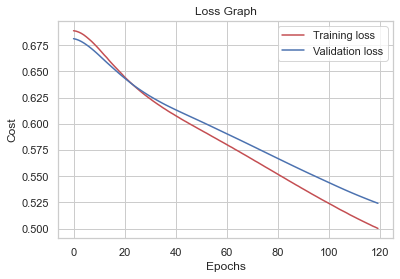

AUC Val: 0.8288566791539409
AUC Train: 0.8338009908467185
Specificity: 0.8860722783030063
Sensitivity: 0.5728337952779795
Positive Predictive Value: 0.7255165108747818
Negative Predictive Value: 0.7890217053112506


(<__main__.DiabetesPredictor at 0x1eb47a7d430>,
 0.8288566791539409,
 0.8860722783030063,
 0.5728337952779795,
 0.7255165108747818,
 0.7890217053112506,
 0.8338009908467185)

In [451]:
cross_val('multi3',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20] )

Se prueba con más epochs.

Fold 0


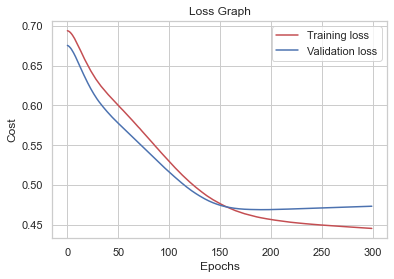

Fold 1


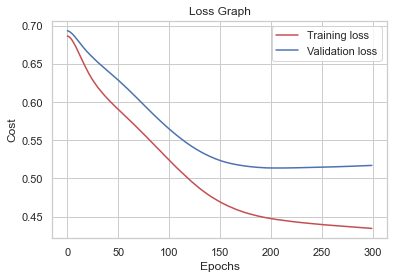

Fold 2


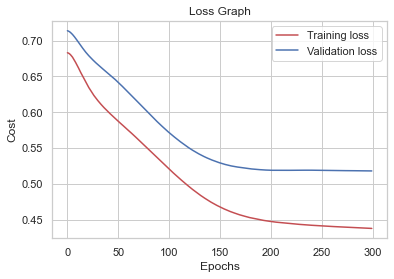

Fold 3


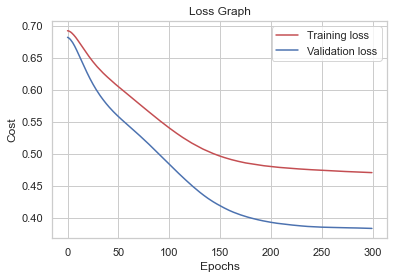

Fold 4


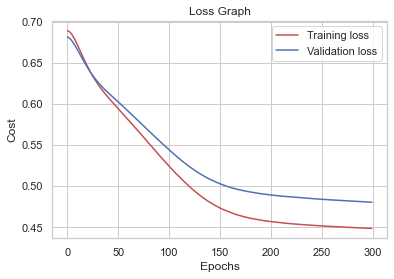

AUC Val: 0.839510363037494
AUC Train: 0.8546524407027922
Specificity: 0.864747604725639
Sensitivity: 0.5895627569065162
Positive Predictive Value: 0.6996108531345773
Negative Predictive Value: 0.7922094376124411


(<__main__.DiabetesPredictor at 0x1eb751883a0>,
 0.839510363037494,
 0.864747604725639,
 0.5895627569065162,
 0.6996108531345773,
 0.7922094376124411,
 0.8546524407027922)

In [452]:
cross_val('multi4',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20], epochs=300 )

Se disminuye el grado de Features Polinomiales a 3.

Fold 0


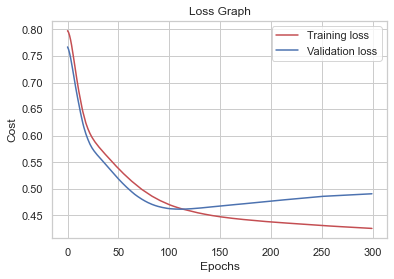

Fold 1


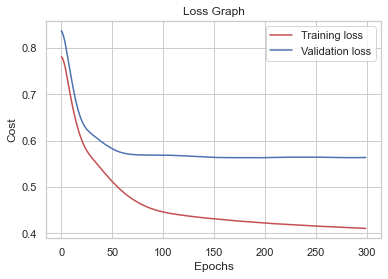

Fold 2


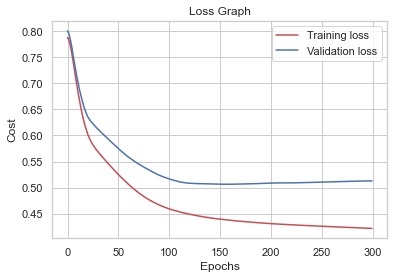

Fold 3


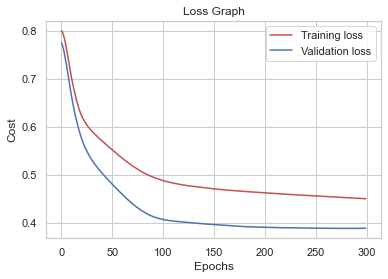

Fold 4


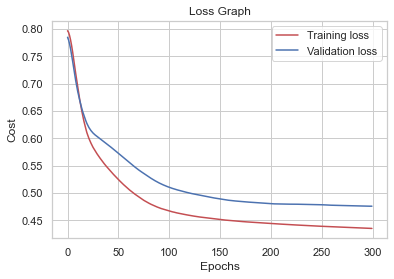

AUC Val: 0.8357937669969756
AUC Train: 0.8675677254005073
Specificity: 0.8562506488776617
Sensitivity: 0.6085162452336592
Positive Predictive Value: 0.6968051903968625
Negative Predictive Value: 0.7974109638885235


(<__main__.DiabetesPredictor at 0x1eb72a44ac0>,
 0.8357937669969756,
 0.8562506488776617,
 0.6085162452336592,
 0.6968051903968625,
 0.7974109638885235,
 0.8675677254005073)

In [453]:
cross_val('multi5',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20], epochs=300, polyFeatDeg=3 )

BatchNormalization

Fold 0


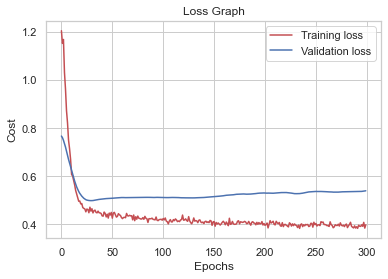

Fold 1


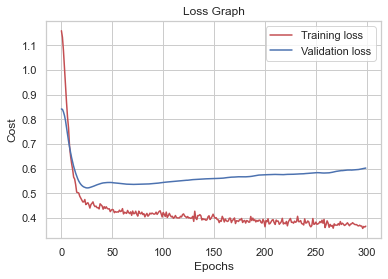

Fold 2


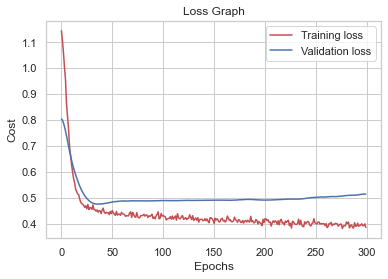

Fold 3


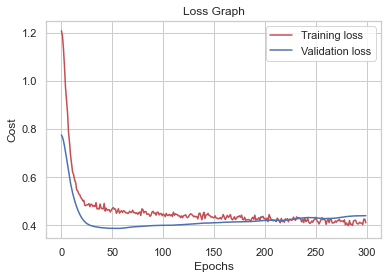

Fold 4


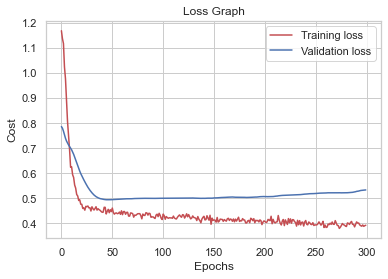

AUC Val: 0.8155236790831794
AUC Train: 0.9040338144586666
Specificity: 0.832192961507914
Sensitivity: 0.6124226630027716
Positive Predictive Value: 0.6643255494449344
Negative Predictive Value: 0.7956786736174599


(<__main__.DiabetesPredictor at 0x1eb42450070>,
 0.8155236790831794,
 0.832192961507914,
 0.6124226630027716,
 0.6643255494449344,
 0.7956786736174599,
 0.9040338144586666)

In [454]:
cross_val('multi6',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20], epochs=300, polyFeatDeg=3, batchNormalization=True )

## Conclusión
En ninguno de los casos analizados con MultiLayer se obtuvieron mejores resultados que los obtenidos anteriormente. Por esta razón se opta por seleccionar al modelo final con los siguientes hiperparámetros:
- Learning Rate: 0.0001
- Momentum: 0.99
- Learning Rate Decay: 0.0001
- PolynomialFeatures.
- Grado de PolynomialFeatures: 4.
- Regularización L2.
- Eliminación de columnas Age y SkinThickness.
- Reemplazo de valores nulos por la mediana.

Fold 0


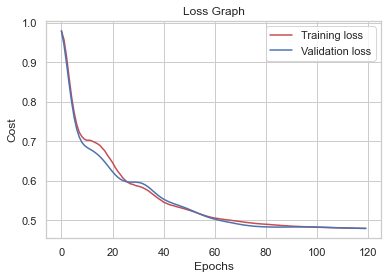

Fold 1


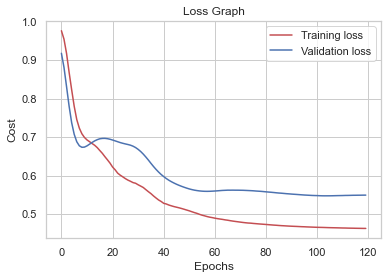

Fold 2


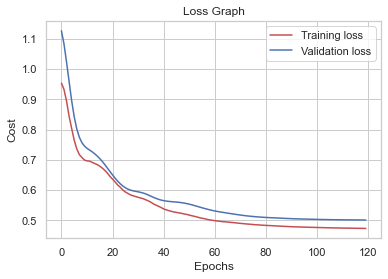

Fold 3


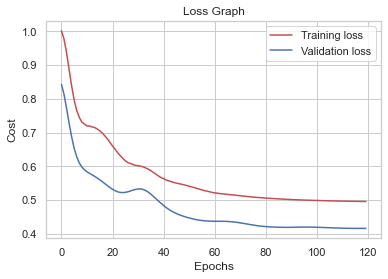

Fold 4


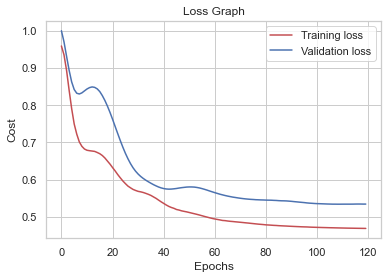

AUC Val: 0.8487197568050926
AUC Train: 0.8573679520871412
Specificity: 0.9077543783551448
Sensitivity: 0.5517028508477607
Positive Predictive Value: 0.758774652476402
Negative Predictive Value: 0.7866971908463912


In [32]:
bestPred, aucBest, speBest, senBest, ppvBest, npvBest, aucTrainLr =cross_val("best",replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=bestDec)

## Test

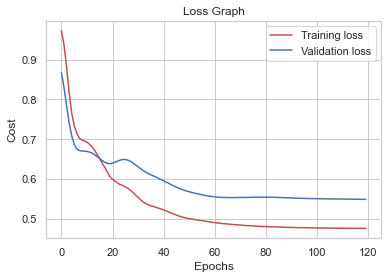

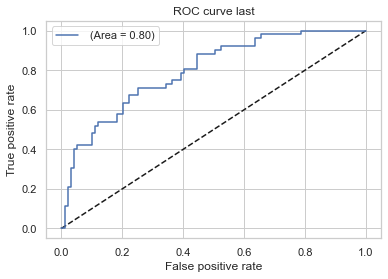

AUC 0.797008547008547
Specificity: tf.Tensor(0.9090909081726355, shape=(), dtype=float64)
Sensitivity: tf.Tensor(0.4230769222633136, shape=(), dtype=float64)
Positive Predictive Value: tf.Tensor(0.7096774170655566, shape=(), dtype=float64)
Negative Predictive Value: tf.Tensor(0.7499999993750001, shape=(), dtype=float64)


In [38]:
lastModel = DiabetesPredictor('last')
lastModel.fit(train_val_data, y_train_val, x_test_data, y_test_values,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=bestDec, testing=True)

### Métricas finales
- AUC: 0.8
- Especificidad: 0.91
- Sensibilidad: 0.42
- Valor Predictivo Positivo: 0.71
- Valor Predictivo Negativo: 0.75

### Pregunta Adicional
Dada la situación en la cual cambia la prevalencia de la enfermedad en la población a ser del 20%. Se desea reutilizar el modelo sin volver a entrenar, 
 ¿Cómo lo harían? ¿Qué métricas se mantienen igual y cuáles cambiarian?

$$Pos. Pred. Value = \frac{TP}{TP+FP}$$
$$Neg. Pred. Value = \frac{TN}{TN+FN}$$
$$Especificidad = \frac{TN}{N}$$
$$Sensibilidad = \frac{TP}{P}$$

El balance de clases anterior era de 65% sanos y 35% diabéticos. Si se quisiera utilizar el modelo sin volverlo a entrenar, habría que tener en cuenta esta variación del 15%. Una posible opción sería cambiar el threshold a 0.65 (un 15% más alto que antes). Con respecto a las métricas, como la especificidad y la sensibilidad cambian dado que dependen del balance de clases la población (P y N). Con respecto a las métricas de PPV, NPV y AUC, al no depender del balance de clases, se mantienen igual.